## Hyper-parameters settings

In [2]:

batchsize = 128
nhidden_encoder = 128
nhidden_decoder = 128
ntimestep = 10
lr = 0.001
epochs = 1000

In [3]:
import pandas as pd
data = pd.read_csv(dataroot)

In [4]:
data

,AAL,AAPL,ADBE,ADI,ADP,ADSK,AKAM,ALXN,AMAT,AMGN,...,TXN,VIAB,VOD,VRTX,WBA,WDC,WFM,XLNX,YHOO,NDX
0,35.9800,96.800,97.80,61.1500,95.4000,58.180000,58.00,127.0400,26.6800,165.8100,...,70.7300,45.2300,31.1701,95.2700,81.365,52.160,33.95,48.6100,38.0100,4665.054
1,35.9310,96.890,97.80,61.6100,95.4115,58.190000,58.12,126.0600,26.7300,165.9101,...,70.6900,45.0100,31.1900,94.1700,81.540,52.150,34.10,48.7400,38.1400,4665.054
2,35.9044,96.950,97.57,61.9800,95.5100,58.203333,57.95,126.5100,26.7120,166.1800,...,71.3000,45.0150,31.2100,94.7490,81.530,52.270,34.01,48.9900,38.1500,4665.826
3,35.8900,96.970,97.55,62.0900,95.5200,58.216667,57.96,126.2800,26.7400,166.1480,...,71.3100,45.0200,31.2100,94.3100,81.710,52.300,33.96,48.9500,38.1950,4667.081
4,36.0080,96.960,97.73,61.8900,95.5300,58.230000,58.21,126.5850,26.7200,165.9900,...,71.0600,45.0500,31.1800,94.1550,81.720,52.300,34.17,48.8900,38.3200,4664.491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40555,48.5030,115.880,104.19,73.2895,102.2900,74.690000,67.39,121.1264,32.9200,146.3911,...,73.8100,34.8100,24.7550,72.1400,84.330,70.230,32.04,59.9200,38.5300,4921.811
40556,48.5150,115.875,104.18,73.2900,102.3100,74.675000,67.43,121.2000,32.9300,146.3951,...,73.8100,34.7950,24.7597,72.0928,84.340,70.220,32.03,59.9290,38.5100,4921.580
40557,48.5300,115.875,104.15,73.2850,102.3200,74.680000,67.40,121.3500,32.9064,146.3700,...,73.8001,34.7901,24.7571,72.0600,84.350,70.165,32.03,59.9345,38.5084,4921.884
40558,48.5600,115.920,104.19,73.3000,102.3100,74.750000,67.35,121.3000,32.9200,146.3400,...,73.8101,34.8200,24.7500,72.0950,84.320,70.210,32.04,59.9400,38.5050,4922.949


## Model Architecture

In [17]:
import matplotlib.pyplot as plt
import pandas as pd

from torch.autograd import Variable

import torch
import numpy as np
from torch import nn
from torch import optim
import torch.nn.functional as F

temporal_attentions = []

class Encoder(nn.Module):
    """encoder in DA_RNN."""

    def __init__(self, T,
                 input_size,
                 encoder_num_hidden,
                 parallel=False):
        """Initialize an encoder in DA_RNN."""
        super(Encoder, self).__init__()
        self.encoder_num_hidden = encoder_num_hidden
        self.input_size = input_size
        self.parallel = parallel
        self.T = T

        # Fig 1. Temporal Attention Mechanism: Encoder is LSTM
        self.encoder_lstm = nn.LSTM(
            input_size=self.input_size,
            hidden_size=self.encoder_num_hidden,
            num_layers = 1
        )

        # Construct Input Attention Mechanism via deterministic attention model
        # Eq. 8: W_e[h_{t-1}; s_{t-1}] + U_e * x^k
        self.encoder_attn = nn.Linear(
            in_features=2 * self.encoder_num_hidden + self.T - 1,
            out_features=1
        )

    def forward(self, X):
        """forward.

        Args:
            X: input data

        """
        X_tilde = Variable(X.data.new(
            X.size(0), self.T - 1, self.input_size).zero_())
        X_encoded = Variable(X.data.new(
            X.size(0), self.T - 1, self.encoder_num_hidden).zero_())

        # Eq. 8, parameters not in nn.Linear but to be learnt
        # v_e = torch.nn.Parameter(data=torch.empty(
        #     self.input_size, self.T).uniform_(0, 1), requires_grad=True)
        # U_e = torch.nn.Parameter(data=torch.empty(
        #     self.T, self.T).uniform_(0, 1), requires_grad=True)

        # h_n, s_n: initial states with dimention hidden_size
        h_n = self._init_states(X)
        s_n = self._init_states(X)

        for t in range(self.T - 1):
            # batch_size * input_size * (2 * hidden_size + T - 1)
            x = torch.cat((h_n.repeat(self.input_size, 1, 1).permute(1, 0, 2),
                           s_n.repeat(self.input_size, 1, 1).permute(1, 0, 2),
                           X.permute(0, 2, 1)), dim=2)

            x = self.encoder_attn(
                x.view(-1, self.encoder_num_hidden * 2 + self.T - 1))

            # get weights by softmax
            alpha = F.softmax(x.view(-1, self.input_size))

            # get new input for LSTM
            x_tilde = torch.mul(alpha, X[:, t, :])

            # Fix the warning about non-contiguous memory
            # https://discuss.pytorch.org/t/dataparallel-issue-with-flatten-parameter/8282
            self.encoder_lstm.flatten_parameters()

            # encoder LSTM
            _, final_state = self.encoder_lstm(x_tilde.unsqueeze(0), (h_n, s_n))
            h_n = final_state[0]
            s_n = final_state[1]

            X_tilde[:, t, :] = x_tilde
            X_encoded[:, t, :] = h_n

        return X_tilde, X_encoded

    def _init_states(self, X):
        """Initialize all 0 hidden states and cell states for encoder.

        Args:
            X

        Returns:
            initial_hidden_states
        """
        # https://pytorch.org/docs/master/nn.html?#lstm
        return Variable(X.data.new(1, X.size(0), self.encoder_num_hidden).zero_())


class Decoder(nn.Module):
    """decoder in DA_RNN."""

    def __init__(self, T, decoder_num_hidden, encoder_num_hidden):
        """Initialize a decoder in DA_RNN."""
        super(Decoder, self).__init__()
        self.decoder_num_hidden = decoder_num_hidden
        self.encoder_num_hidden = encoder_num_hidden
        self.T = T

        self.attn_layer = nn.Sequential(
            nn.Linear(2 * decoder_num_hidden + encoder_num_hidden, encoder_num_hidden),
            nn.Tanh(),
            nn.Linear(encoder_num_hidden, 1)
        )
        self.lstm_layer = nn.LSTM(
            input_size=1,
            hidden_size=decoder_num_hidden
        )
        self.fc = nn.Linear(encoder_num_hidden + 1, 1)
        self.fc_final = nn.Linear(decoder_num_hidden + encoder_num_hidden, 1)

        self.fc.weight.data.normal_()

    def forward(self, X_encoded, y_prev):
        """forward."""
        d_n = self._init_states(X_encoded)
        c_n = self._init_states(X_encoded)

        for t in range(self.T - 1):

            x = torch.cat((d_n.repeat(self.T - 1, 1, 1).permute(1, 0, 2),
                           c_n.repeat(self.T - 1, 1, 1).permute(1, 0, 2),
                           X_encoded), dim=2)

            beta = F.softmax(self.attn_layer(
                x.view(-1, 2 * self.decoder_num_hidden + self.encoder_num_hidden)).view(-1, self.T - 1))
 
            # Eqn. 14: compute context vector
            # batch_size * encoder_hidden_size
            context = torch.bmm(beta.unsqueeze(1), X_encoded)[:, 0, :]
            if t < self.T - 1:
                # Eqn. 15
                # batch_size * 1
                y_tilde = self.fc(
                    torch.cat((context, y_prev[:, t].unsqueeze(1)), dim=1))

                # Eqn. 16: LSTM
                self.lstm_layer.flatten_parameters()
                _, final_states = self.lstm_layer(
                    y_tilde.unsqueeze(0), (d_n, c_n))

                d_n = final_states[0]  # 1 * batch_size * decoder_num_hidden
                c_n = final_states[1]  # 1 * batch_size * decoder_num_hidden

        # Eqn. 22: final output
        y_pred = self.fc_final(torch.cat((d_n[0], context), dim=1))

        return y_pred

    def _init_states(self, X):
        """Initialize all 0 hidden states and cell states for encoder.

        Args:
            X
        Returns:
            initial_hidden_states

        """
        # hidden state and cell state [num_layers*num_directions, batch_size, hidden_size]
        # https://pytorch.org/docs/master/nn.html?#lstm
        return Variable(X.data.new(1, X.size(0), self.decoder_num_hidden).zero_())


class DA_rnn(nn.Module):
    """da_rnn."""

    def __init__(self, X, y, T,
                 encoder_num_hidden,
                 decoder_num_hidden,
                 batch_size,
                 learning_rate,
                 epochs,
                 parallel=False):
        """da_rnn initialization."""
        super(DA_rnn, self).__init__()
        self.encoder_num_hidden = encoder_num_hidden
        self.decoder_num_hidden = decoder_num_hidden
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.parallel = parallel
        self.shuffle = False
        self.epochs = epochs
        self.T = T
        self.X = X
        self.y = y

        self.device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator: ", self.device)

        self.Encoder = Encoder(input_size=X.shape[1],
                               encoder_num_hidden=encoder_num_hidden,
                               T=T).to(self.device)
        self.Decoder = Decoder(encoder_num_hidden=encoder_num_hidden,
                               decoder_num_hidden=decoder_num_hidden,
                               T=T).to(self.device)

        # Loss function
        self.criterion = nn.MSELoss()

        if self.parallel:
            self.encoder = nn.DataParallel(self.encoder)
            self.decoder = nn.DataParallel(self.decoder)

        self.encoder_optimizer = optim.Adam(params=filter(lambda p: p.requires_grad,
                                                          self.Encoder.parameters()),
                                            lr=self.learning_rate)
        self.decoder_optimizer = optim.Adam(params=filter(lambda p: p.requires_grad,
                                                          self.Decoder.parameters()),
                                            lr=self.learning_rate)

        # Training set
        self.train_timesteps = int(self.X.shape[0] * 0.8)
        print("average", np.mean(self.y[:self.train_timesteps]) )
        # self.y = self.y - np.mean(self.y[:self.train_timesteps]) 

        self.input_size = self.X.shape[1]

    def train(self):
        """training process."""
        iter_per_epoch = int(np.ceil(self.train_timesteps * 1. / self.batch_size))
        self.iter_losses = np.zeros(self.epochs * iter_per_epoch)
        self.epoch_losses = np.zeros(self.epochs)

        n_iter = 0

        for epoch in range(self.epochs):
            if self.shuffle:
                ref_idx = np.random.permutation(self.train_timesteps - self.T)
            else:
                ref_idx = np.array(range(self.train_timesteps - self.T))

            idx = 0

            while (idx < self.train_timesteps):
                # get the indices of X_train
                indices = ref_idx[idx:(idx + self.batch_size)]
                # x = np.zeros((self.T - 1, len(indices), self.input_size))
                x = np.zeros((len(indices), self.T - 1, self.input_size))
                y_prev = np.zeros((len(indices), self.T - 1))

                y_gt = self.y[indices + self.T]


                # format x into 3D tensor
                for bs in range(len(indices)):
                    x[bs, :, :] = self.X[indices[bs]:(indices[bs] + self.T - 1), :]
                    y_prev[bs, :] = self.y[indices[bs]: (indices[bs] + self.T - 1)]

                loss = self.train_forward(x, y_prev, y_gt)
                self.iter_losses[int(epoch * iter_per_epoch + idx / self.batch_size)] = loss

                idx += self.batch_size
                n_iter += 1

                if n_iter % 10000 == 0 and n_iter != 0:
                    for param_group in self.encoder_optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                    for param_group in self.decoder_optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9

                self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            if epoch % 10 == 0:
                print("Epochs: ", epoch, " Iterations: ", n_iter,
                      " Loss: ", self.epoch_losses[epoch])

            if epoch % 10 == 0:
                y_train_pred = self.test(on_train=True)
                y_test_pred = self.test(on_train=False)
                y_pred = np.concatenate((y_train_pred, y_test_pred))
                plt.ioff()
                plt.rcParams["figure.figsize"] = (20,10)
                plt.figure()
                plt.plot(range(1, 1 + len(self.y)), self.y, label="True")
                plt.plot(range(self.T, len(y_train_pred) + self.T),
                         y_train_pred, label='Predicted - Train')
                plt.plot(range(self.T + len(y_train_pred), len(self.y) + 1),
                         y_test_pred, label='Predicted - Test')
                plt.legend(loc='upper left')
                plt.show()

            # # Save files in last iterations
            # if epoch == self.epochs - 1:
            #     np.savetxt('../loss.txt', np.array(self.epoch_losses), delimiter=',')
            #     np.savetxt('../y_pred.txt',
            #                np.array(self.y_pred), delimiter=',')
            #     np.savetxt('../y_true.txt',
            #                np.array(self.y_true), delimiter=',')

    def train_forward(self, X, y_prev, y_gt):
        """
        Forward pass.

        Args:
            X:
            y_prev:
            y_gt: Ground truth label

        """
        # zero gradients
        self.encoder_optimizer.zero_grad()
        self.decoder_optimizer.zero_grad()

        input_weighted, input_encoded = self.Encoder(
            Variable(torch.from_numpy(X).type(torch.FloatTensor).to(self.device)))
        y_pred = self.Decoder(input_encoded, Variable(
            torch.from_numpy(y_prev).type(torch.FloatTensor).to(self.device)))

        y_true = Variable(torch.from_numpy(
            y_gt).type(torch.FloatTensor).to(self.device))

        y_true = y_true.view(-1, 1)
        loss = self.criterion(y_pred, y_true)
        loss.backward()

        self.encoder_optimizer.step()
        self.decoder_optimizer.step()

        return loss.item()


    def test(self, on_train=False):
        """test."""

        if on_train:
            y_pred = np.zeros(self.train_timesteps - self.T + 1)
        else:
            y_pred = np.zeros(self.X.shape[0] - self.train_timesteps)

        i = 0
        while i < len(y_pred):
            batch_idx = np.array(range(len(y_pred)))[i: (i + self.batch_size)]
            X = np.zeros((len(batch_idx), self.T - 1, self.X.shape[1]))
            y_history = np.zeros((len(batch_idx), self.T - 1))

            for j in range(len(batch_idx)):
                if on_train:
                    X[j, :, :] = self.X[range(
                        batch_idx[j], batch_idx[j] + self.T - 1), :]
                    y_history[j, :] = self.y[range(
                        batch_idx[j], batch_idx[j] + self.T - 1)]
                else:
                    X[j, :, :] = self.X[range(
                        batch_idx[j] + self.train_timesteps - self.T, batch_idx[j] + self.train_timesteps - 1), :]
                    y_history[j, :] = self.y[range(
                        batch_idx[j] + self.train_timesteps - self.T, batch_idx[j] + self.train_timesteps - 1)]

            y_history = Variable(torch.from_numpy(
                y_history).type(torch.FloatTensor).to(self.device))
            _, input_encoded = self.Encoder(
                Variable(torch.from_numpy(X).type(torch.FloatTensor).to(self.device)))
            y_pred[i:(i + self.batch_size)] = self.Decoder(input_encoded,
                                                           y_history).cpu().data.numpy()[:, 0]
            i += self.batch_size

        return y_pred


## Util Function

In [18]:
trial = pd.read_csv("/home/grads/z/zhale/CufflessBP/Signal_Morphology_Analysis/PPG_Data/segmented_bioz_beats_normalized_time_amplitude_df_75H_session1_all_trials.csv")
SBP = pd.read_csv("/home/grads/z/zhale/CufflessBP/Signal_Morphology_Analysis/PPG_Data/Segmented_SBP_75H_session01_All_Trials.csv")
BP = SBP.iloc[:len(trial)]
trial['SBP'] = BP['SBP']
trial['DBP'] = BP['DBP']

In [19]:
import numpy as np
import pandas as pd


def read_data(input_path, debug=True):
    """Read nasdaq stocks data.

    Args:
        input_path (str): directory to nasdaq dataset.

    Returns:
        X (np.ndarray): features.
        y (np.ndarray): ground truth.

    """
    df = pd.read_csv(input_path, nrows=250 if debug else None)
    # X = df.iloc[:, 0:-1].values
    # X = df.loc[:, [x for x in df.columns.tolist() if x != 'NDX']].as_matrix()
    # X = trial.iloc[:,:-3]
    X = trial.iloc[:, 0:-3].values
    print(X)
    
    # y = df.iloc[:, -1].values
    # y = np.array(df.NDX)
    y = np.array(trial.SBP)
    # y = np.array(trial.iloc[:,-2])

    return X, y

In [20]:
# fig3 = plt.figure()
# plt.plot(y_pred+153.8243909615611, label='Predicted')
# plt.plot(model.y[model.train_timesteps:]+153.8243909615611, label="True")
# plt.legend(loc='upper left')
# plt.savefig("3.png")     
# plt.show()

## Main

==> Load dataset ...
[137.81738281 137.81738281 137.81738281 ... 143.29528809 146.11816406
 147.39990234]
==> Initialize DA-RNN model ...
==> Use accelerator:  cuda:2
average 152.00083661708328
==> Start training ...


/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  0  Iterations:  9  Loss:  23132.6171875


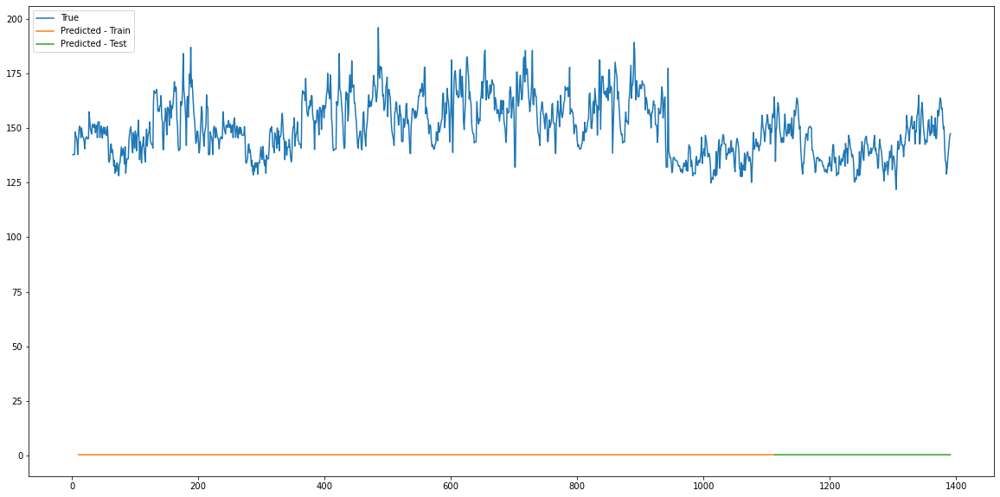

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  10  Iterations:  99  Loss:  15921.446397569445


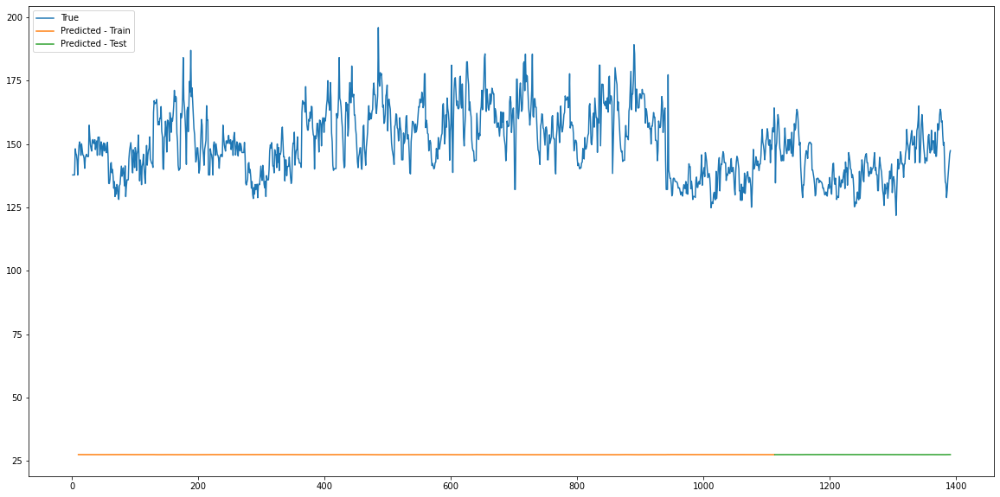

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  20  Iterations:  189  Loss:  10899.465060763889


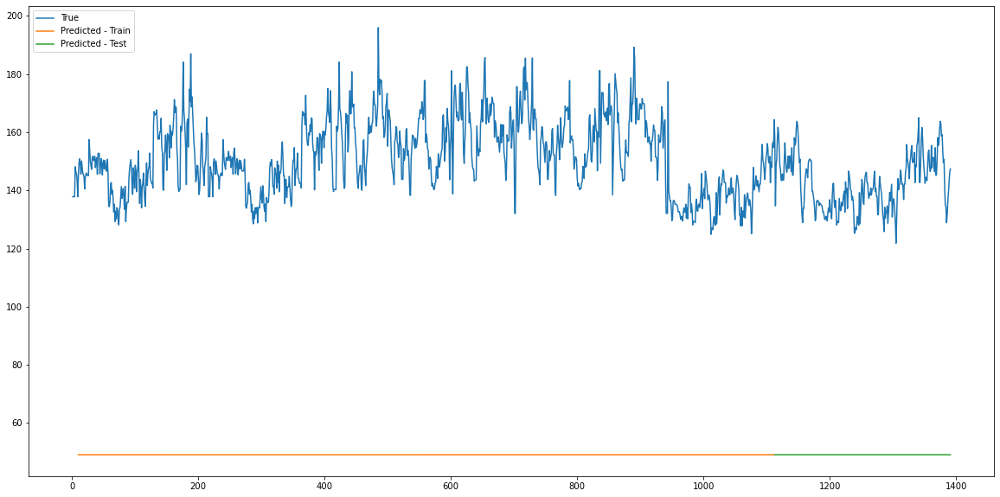

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  30  Iterations:  279  Loss:  7419.426106770833


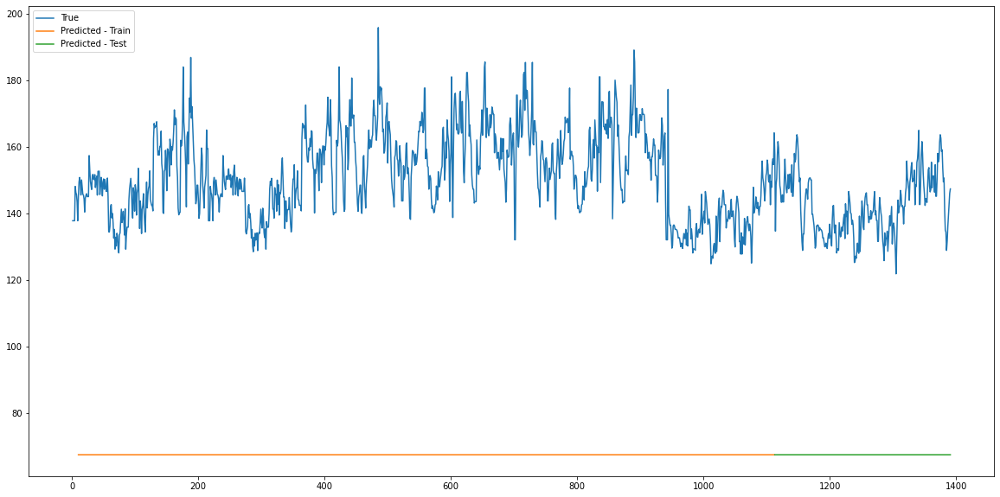

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  40  Iterations:  369  Loss:  4948.283175998264


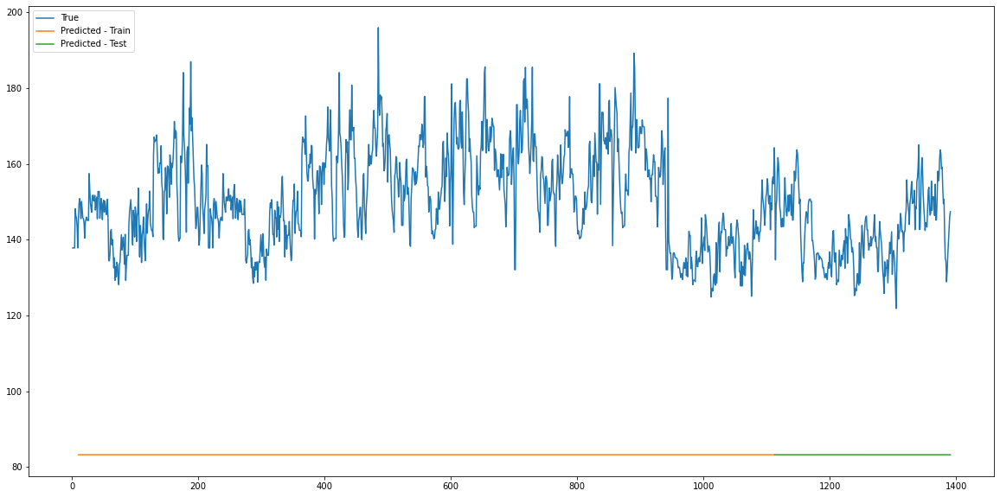

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  50  Iterations:  459  Loss:  3236.881537543403


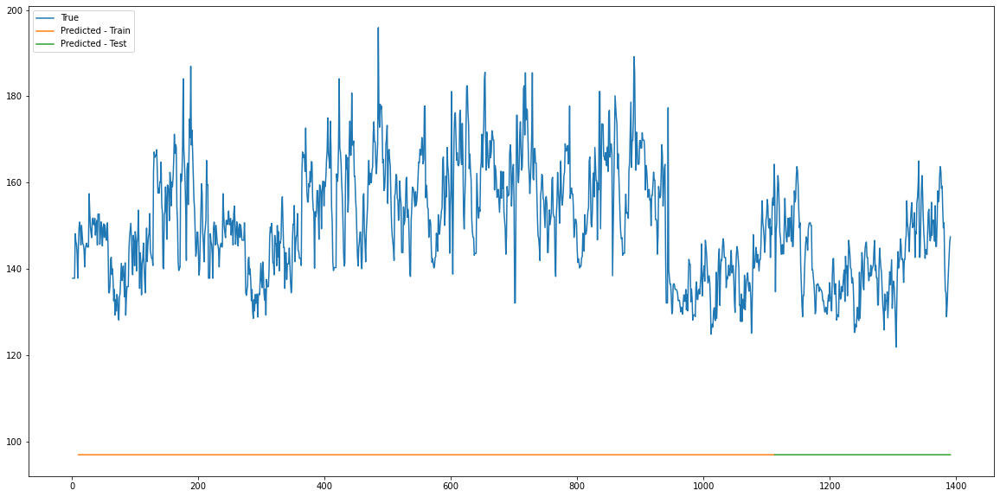

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  60  Iterations:  549  Loss:  2072.257025824653


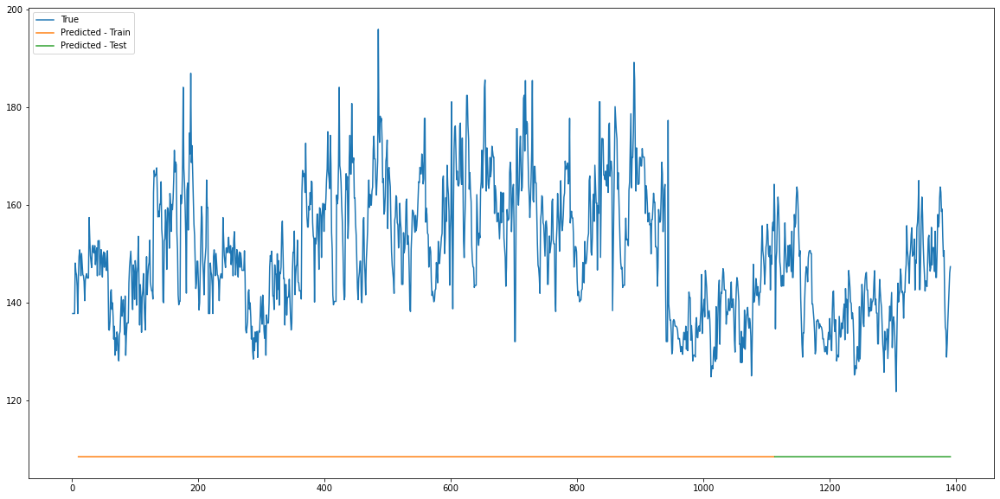

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  70  Iterations:  639  Loss:  1304.2412923177083


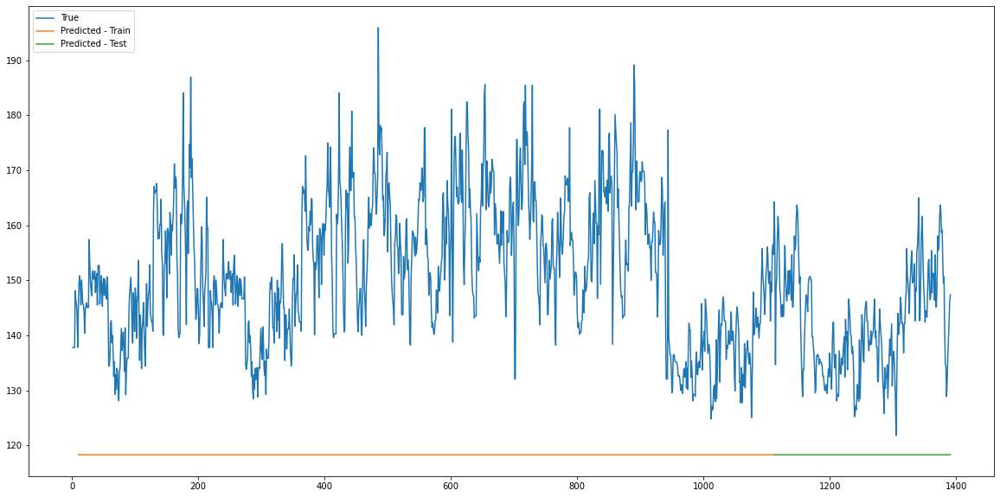

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  80  Iterations:  729  Loss:  803.3717617458767


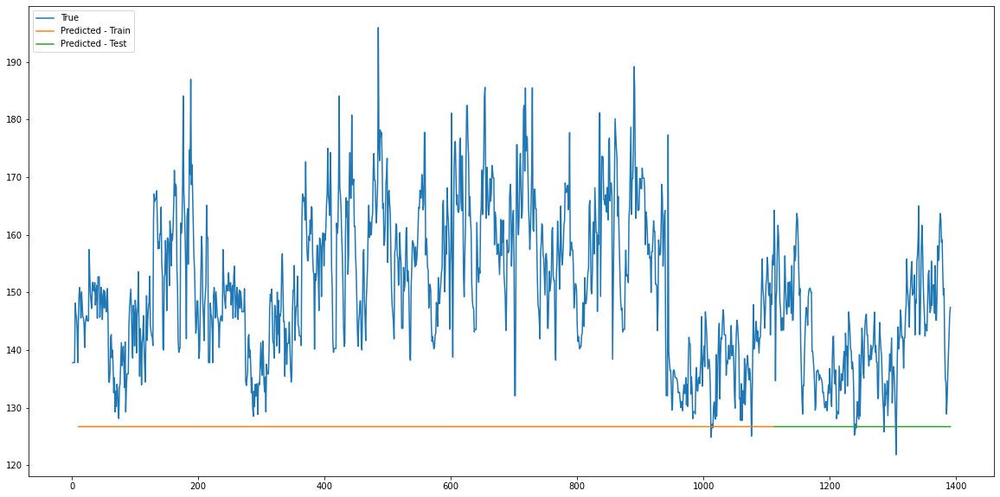

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  90  Iterations:  819  Loss:  508.0916052924262


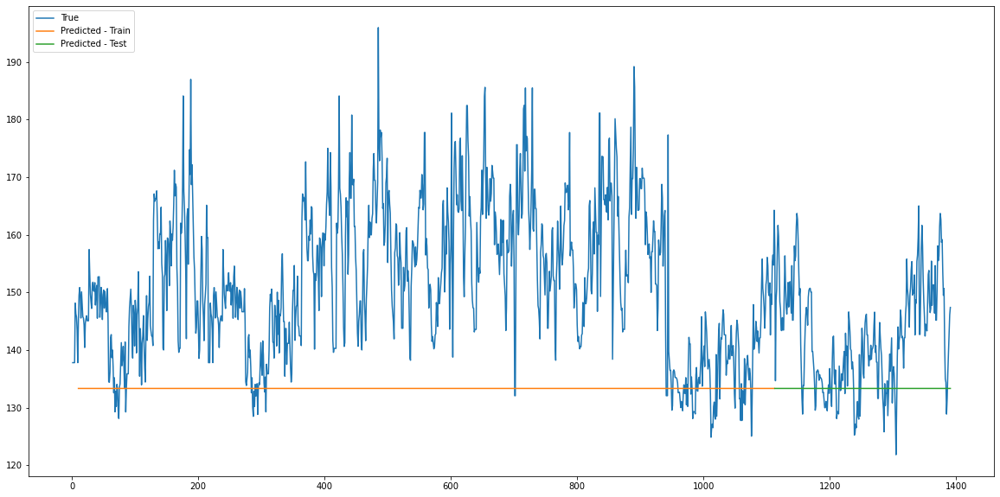

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  100  Iterations:  909  Loss:  340.16042073567706


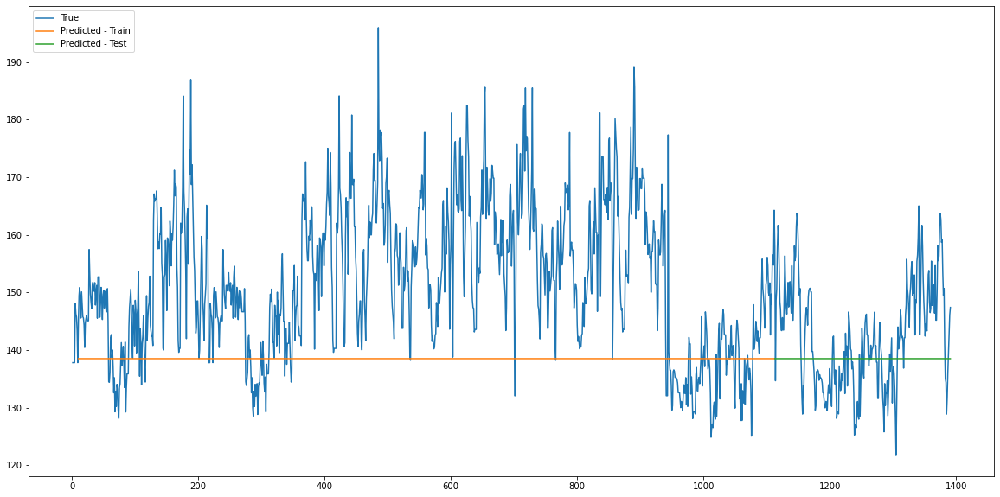

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  110  Iterations:  999  Loss:  248.99007415771484


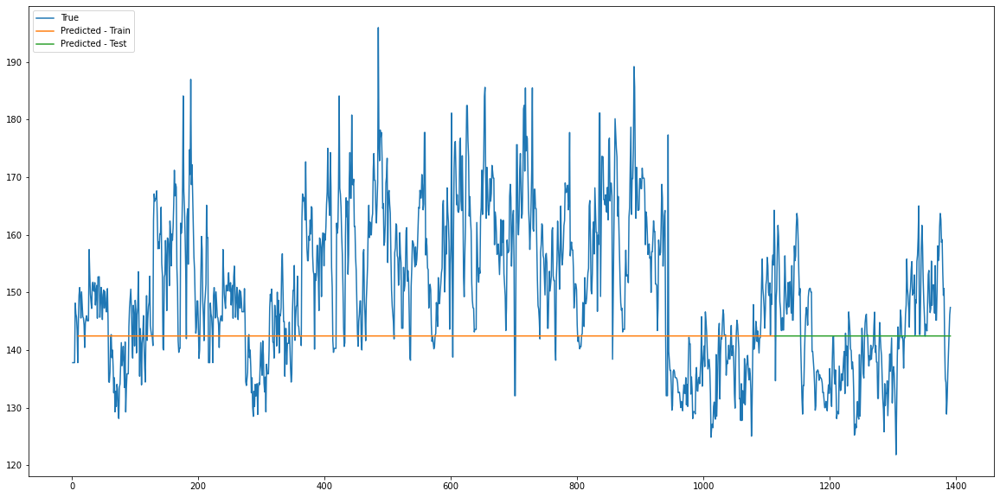

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  120  Iterations:  1089  Loss:  201.97679731580945


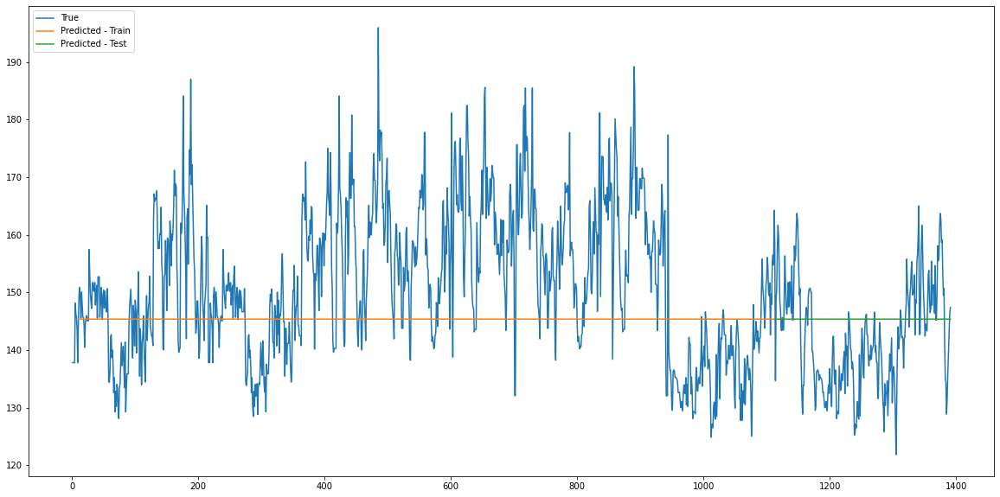

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  130  Iterations:  1179  Loss:  179.03717634412976


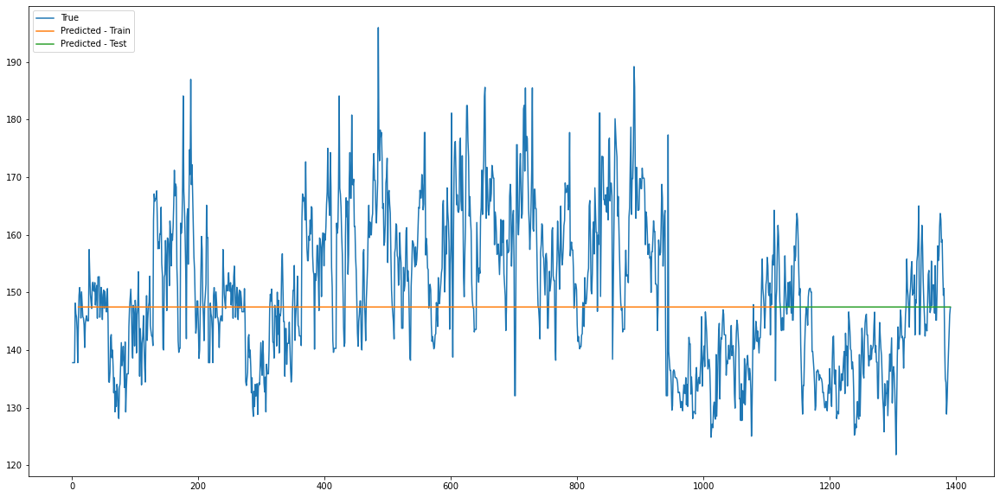

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  140  Iterations:  1269  Loss:  174.09530131022134


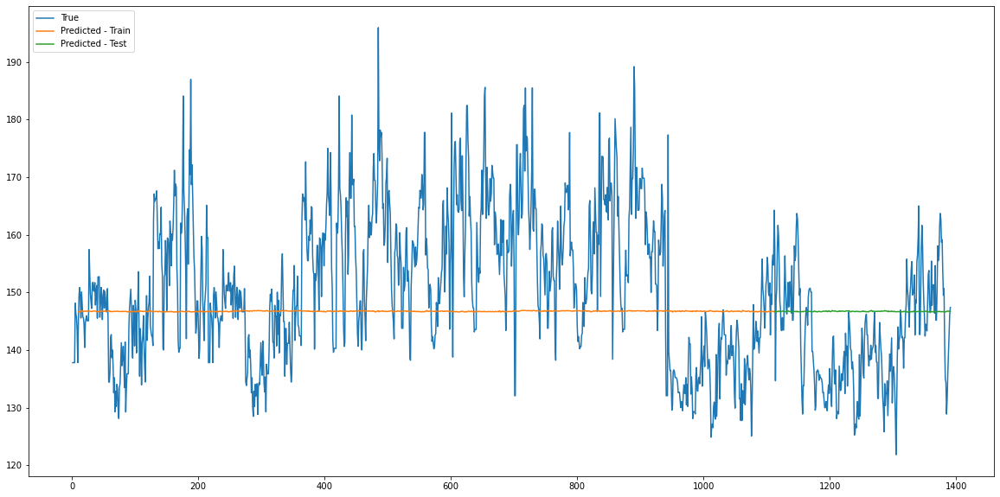

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  150  Iterations:  1359  Loss:  187.53198920355902


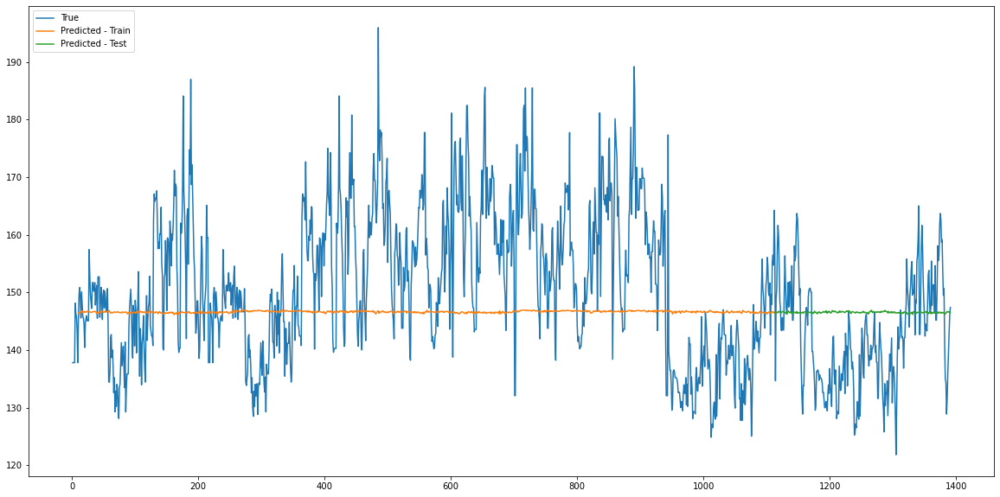

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  160  Iterations:  1449  Loss:  164.32615915934244


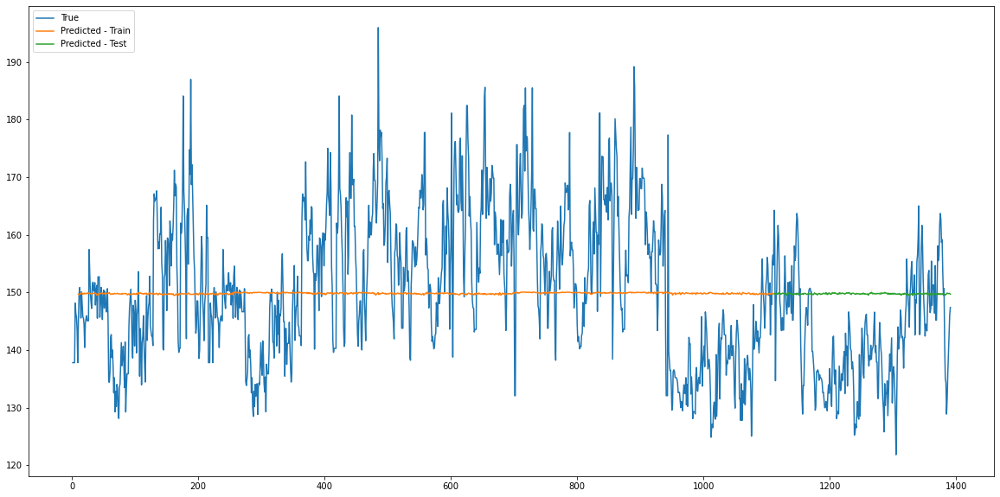

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  170  Iterations:  1539  Loss:  161.97240702311197


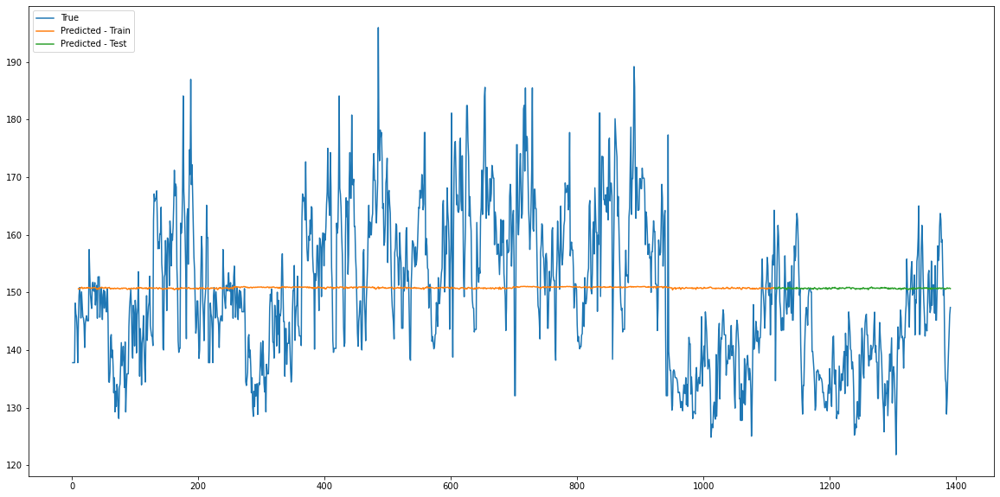

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  180  Iterations:  1629  Loss:  156.58641391330295


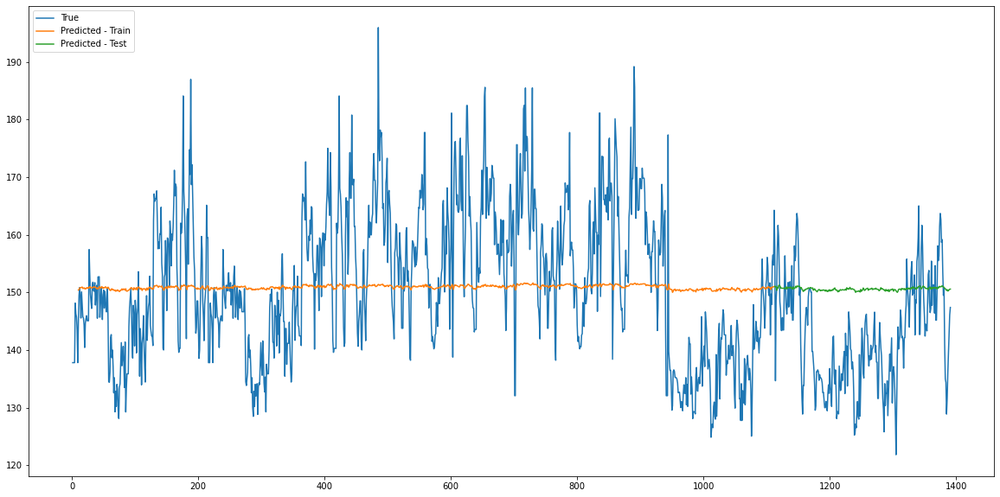

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  190  Iterations:  1719  Loss:  153.4746348063151


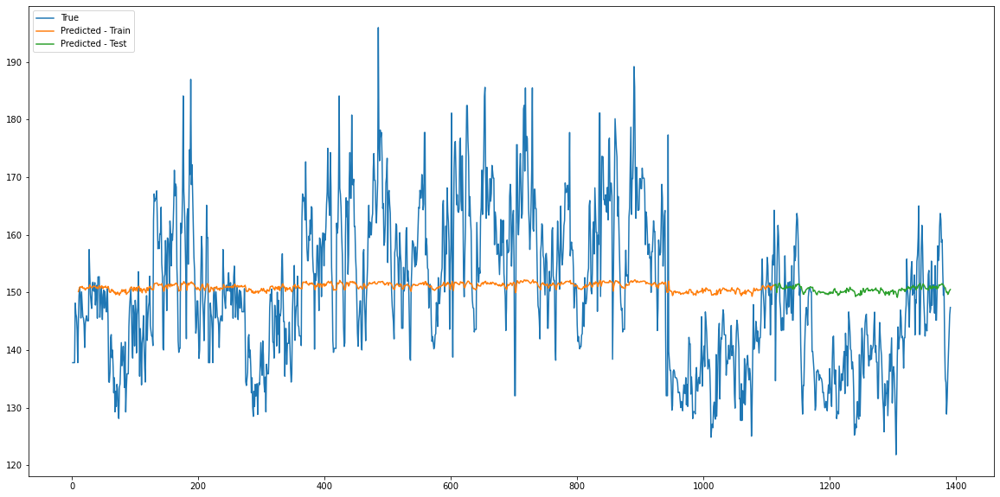

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  200  Iterations:  1809  Loss:  143.03956773546008


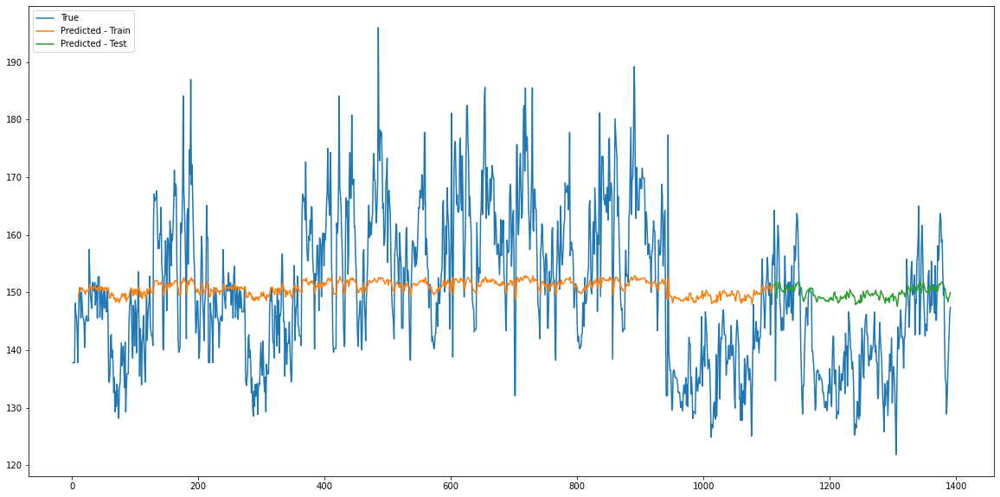

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  210  Iterations:  1899  Loss:  132.70870039198132


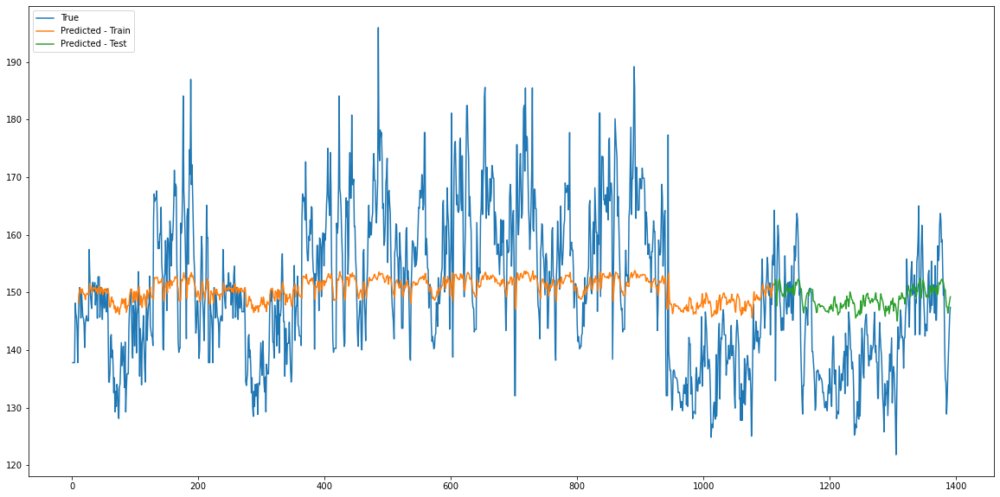

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  220  Iterations:  1989  Loss:  121.44208357069228


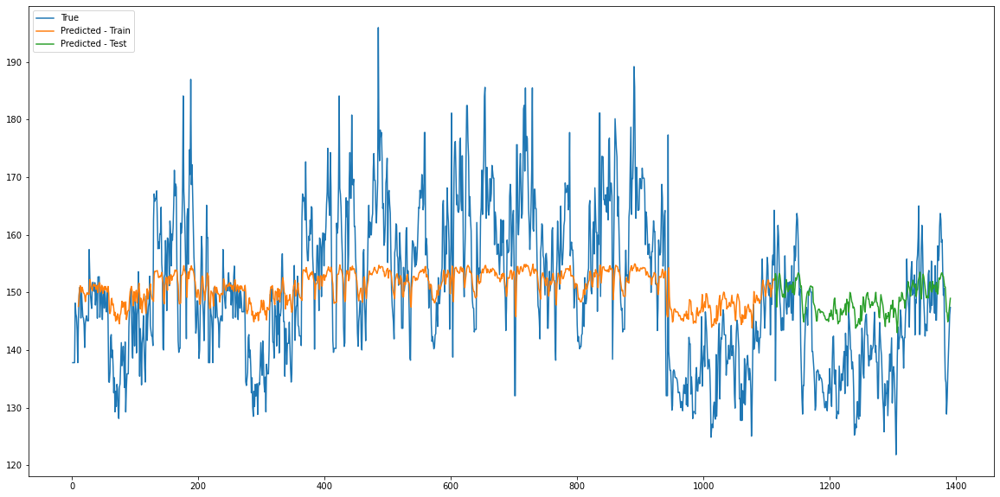

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  230  Iterations:  2079  Loss:  111.47266345553928


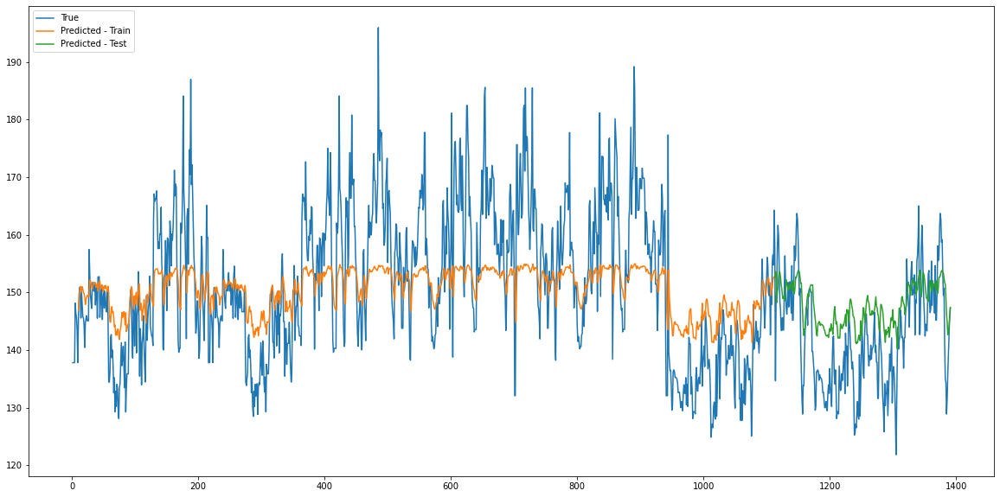

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  240  Iterations:  2169  Loss:  95.94649336073134


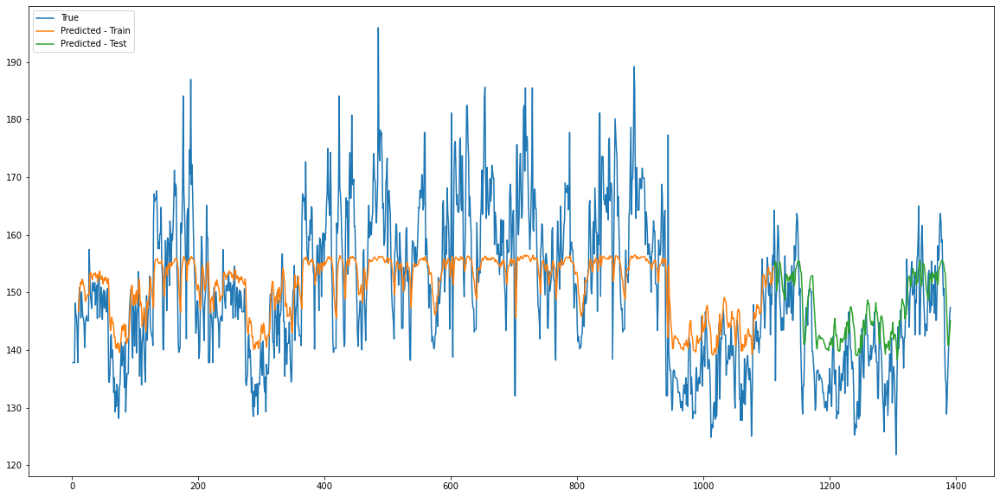

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  250  Iterations:  2259  Loss:  84.94398668077257


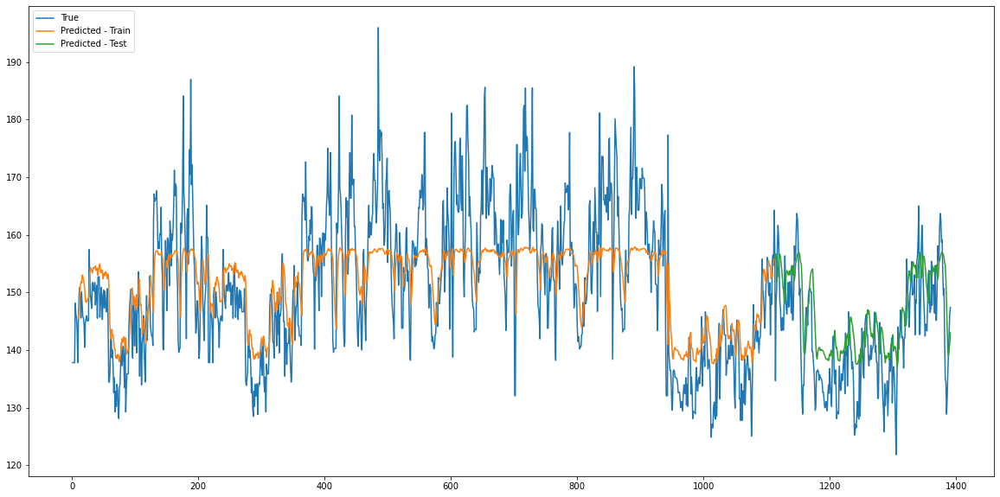

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  260  Iterations:  2349  Loss:  78.29451200697157


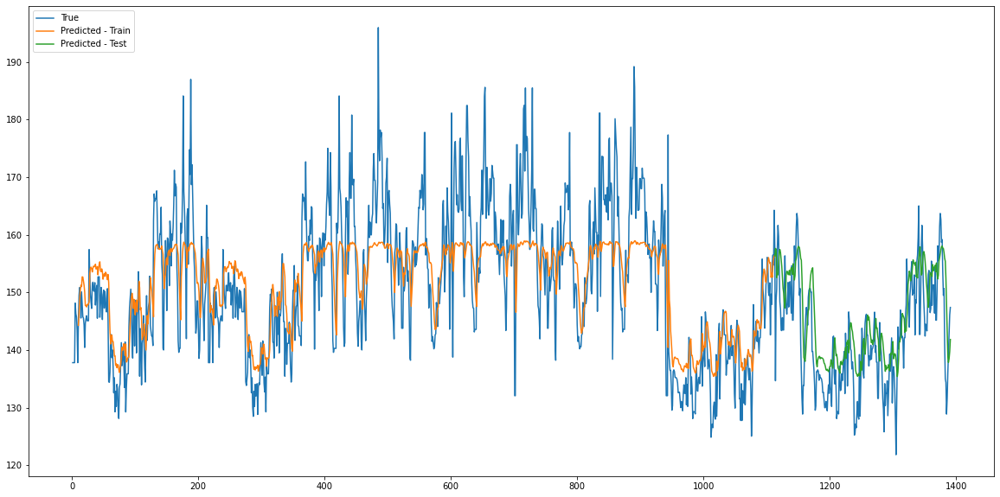

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  270  Iterations:  2439  Loss:  73.72164408365886


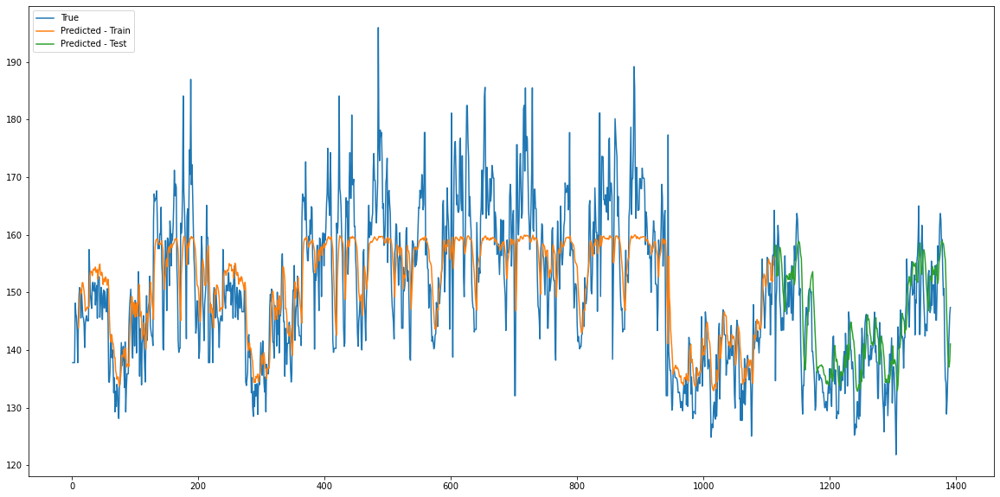

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  280  Iterations:  2529  Loss:  70.7889044019911


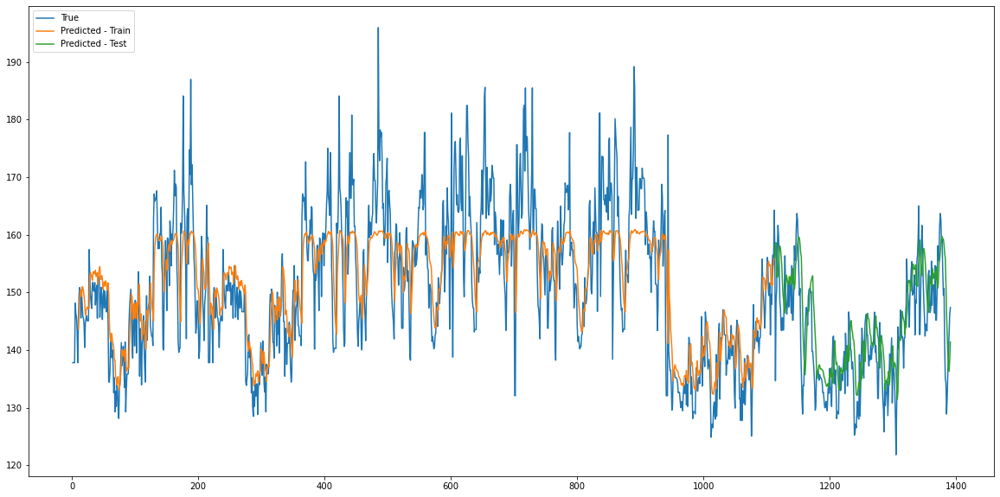

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  290  Iterations:  2619  Loss:  68.53634558783637


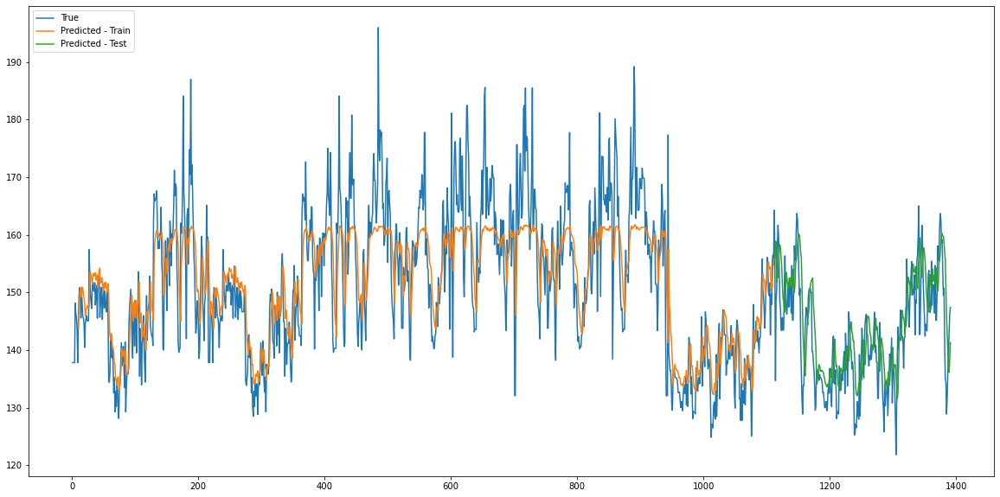

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  300  Iterations:  2709  Loss:  66.58511734008789


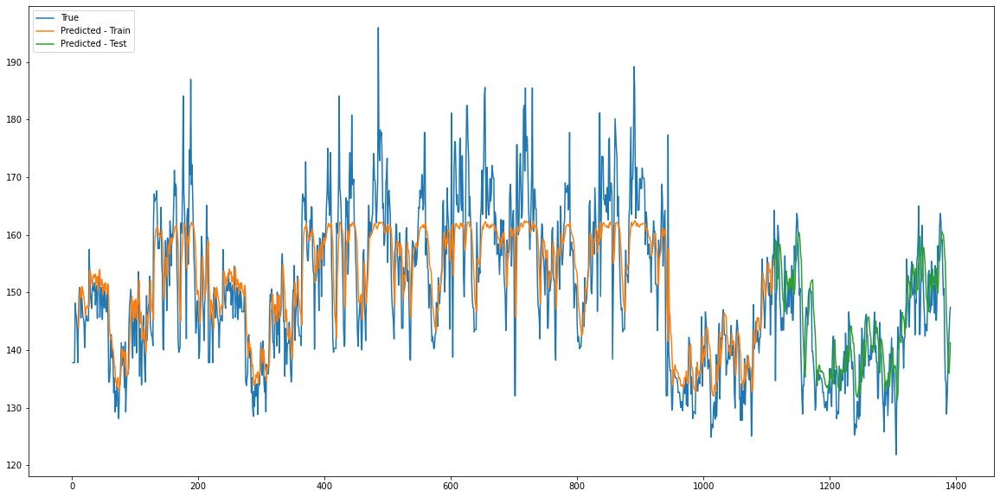

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  310  Iterations:  2799  Loss:  65.71609369913737


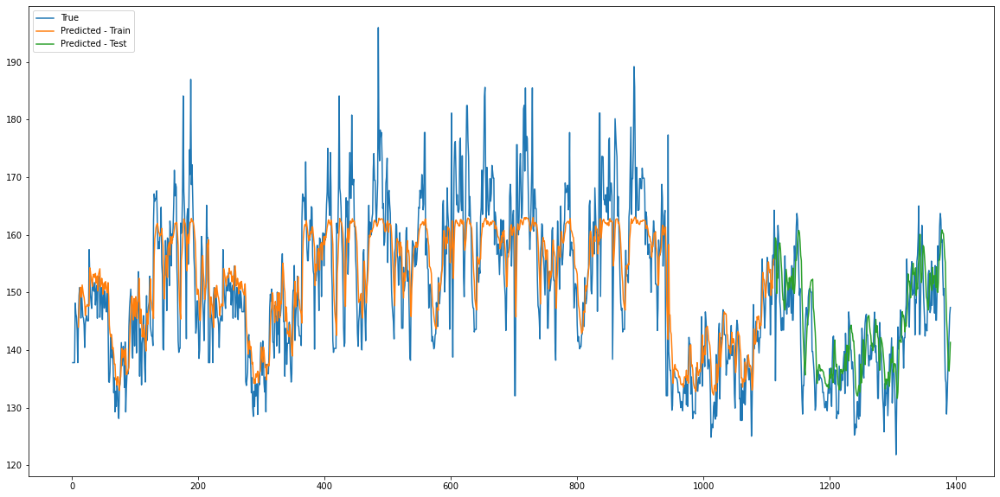

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  320  Iterations:  2889  Loss:  64.30201233757867


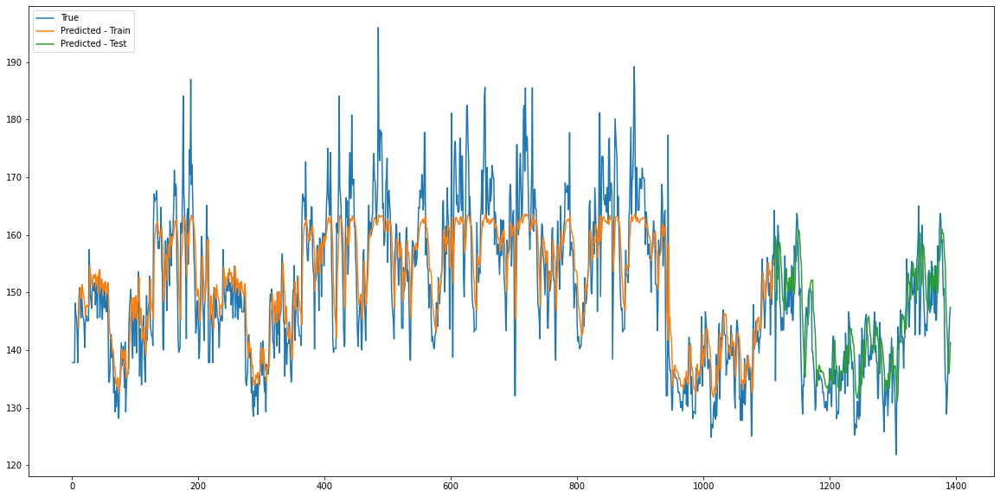

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  330  Iterations:  2979  Loss:  63.38442293802897


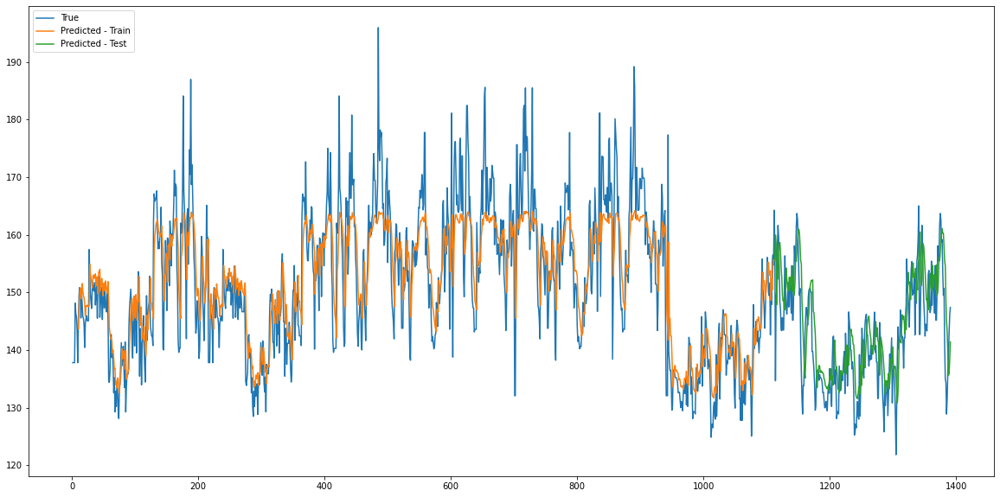

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  340  Iterations:  3069  Loss:  62.651896158854164


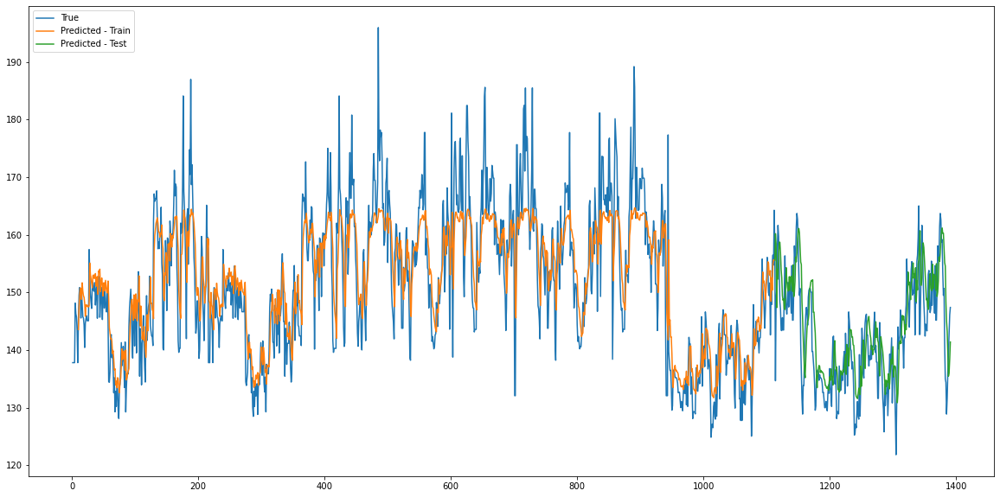

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  350  Iterations:  3159  Loss:  62.03093443976508


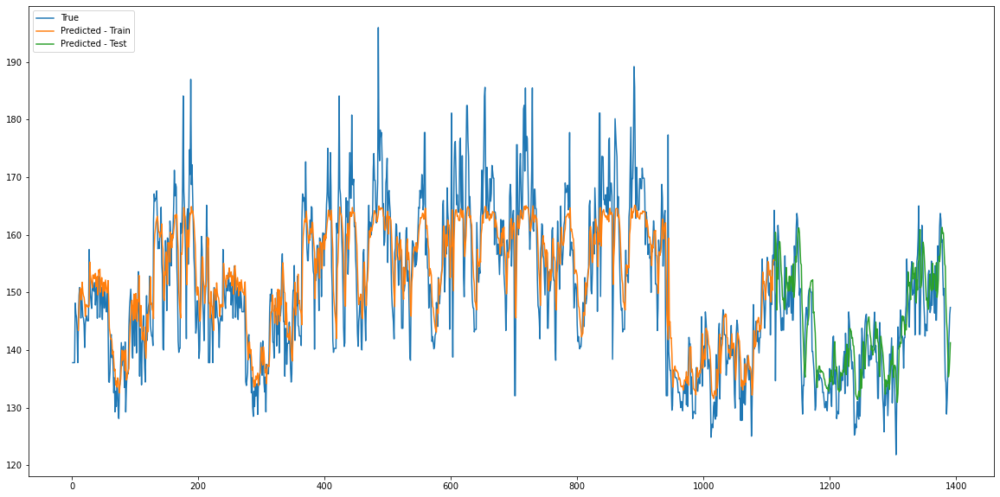

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  360  Iterations:  3249  Loss:  61.47249391343858


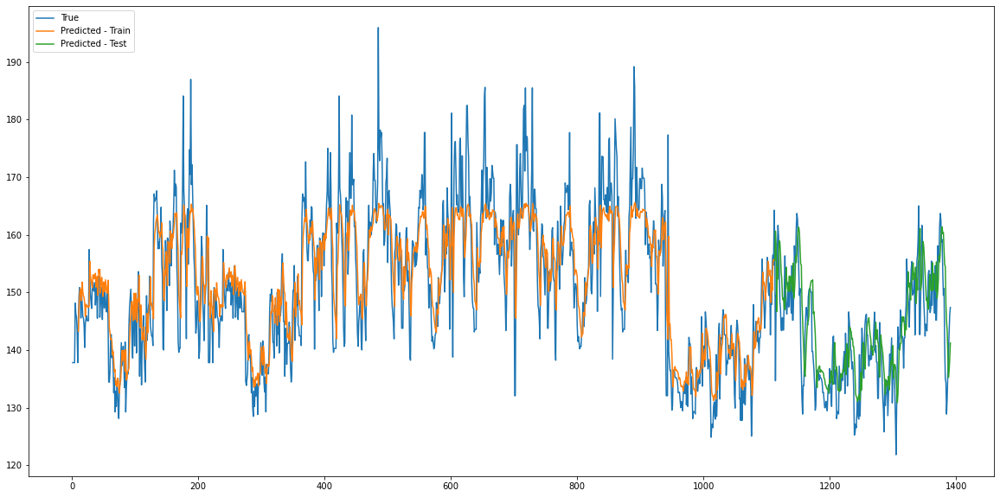

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  370  Iterations:  3339  Loss:  60.90115610758463


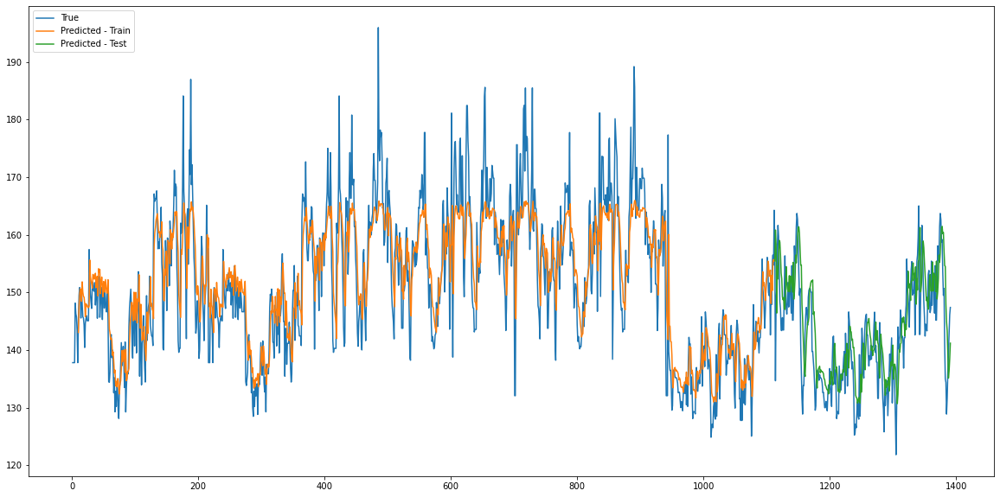

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  380  Iterations:  3429  Loss:  60.45278888278537


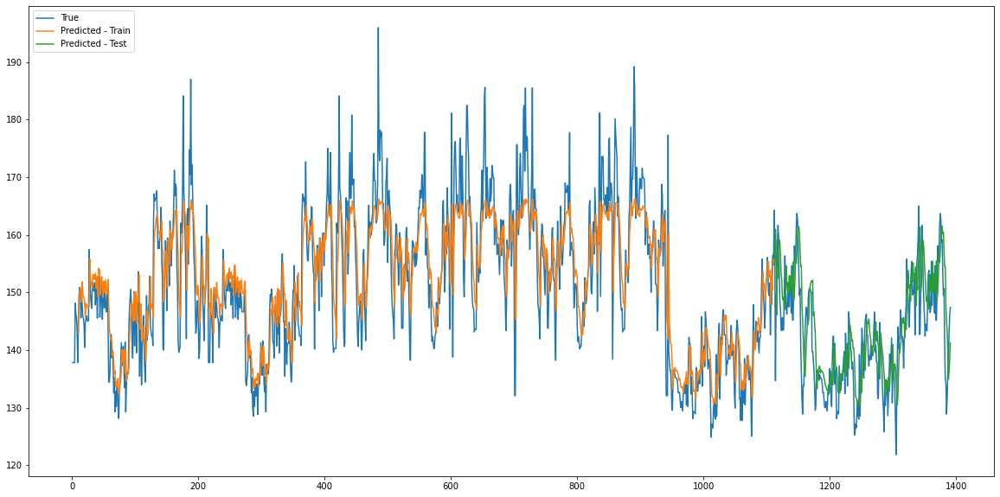

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  390  Iterations:  3519  Loss:  60.10440678066678


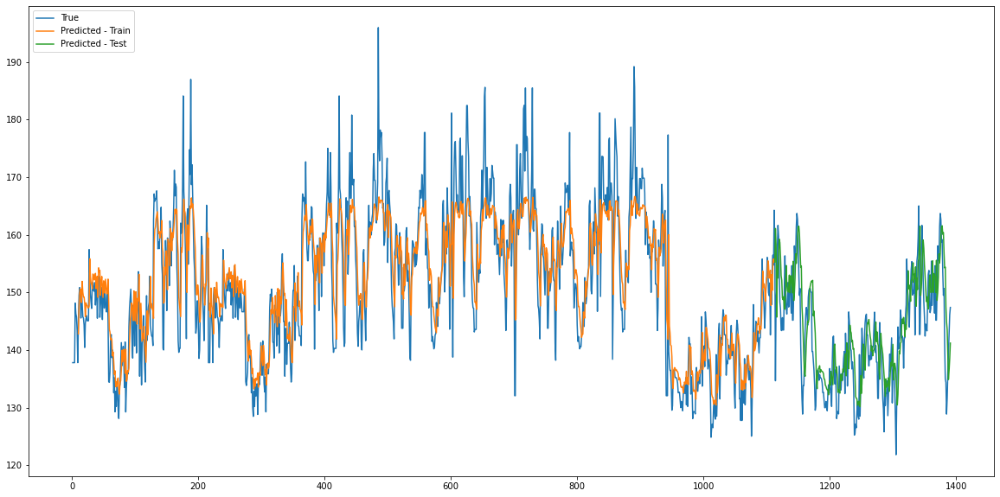

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  400  Iterations:  3609  Loss:  59.794594870673286


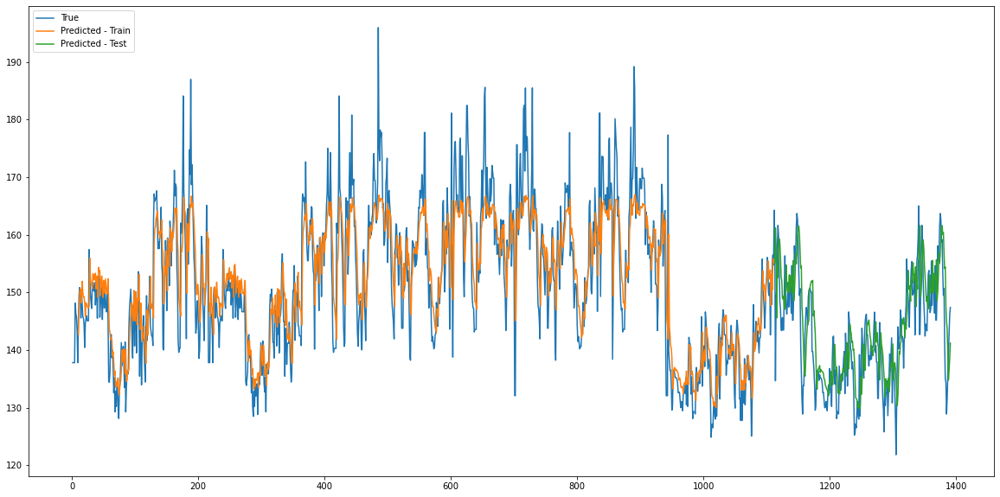

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  410  Iterations:  3699  Loss:  59.50694931877984


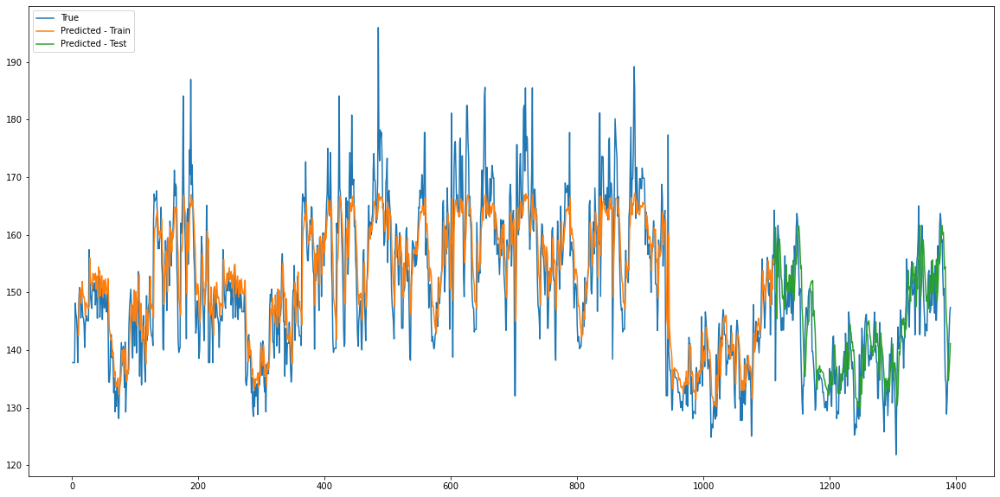

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  420  Iterations:  3789  Loss:  59.280556784735786


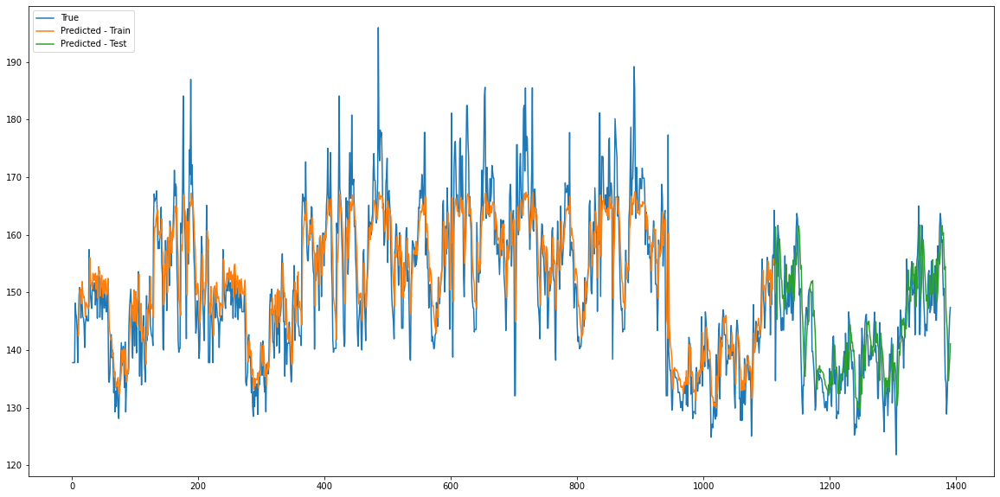

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  430  Iterations:  3879  Loss:  59.13367059495714


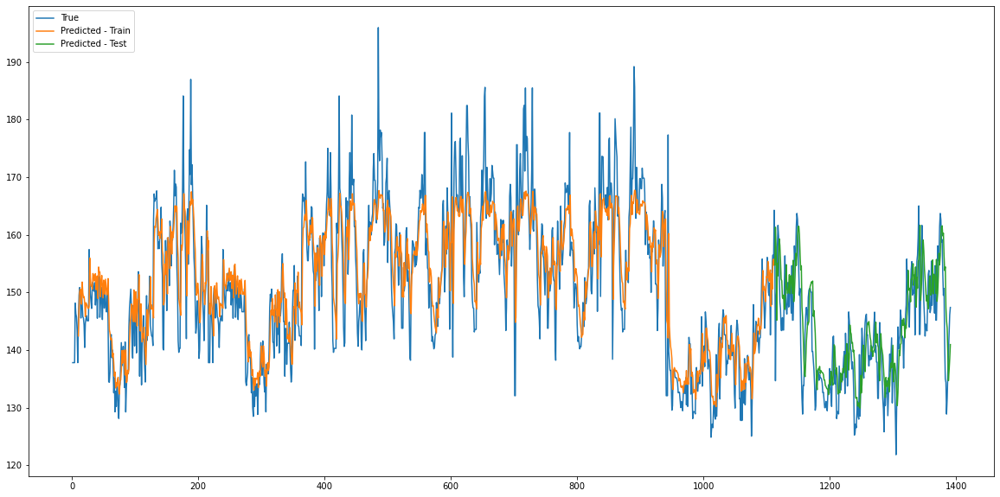

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  440  Iterations:  3969  Loss:  59.34610366821289


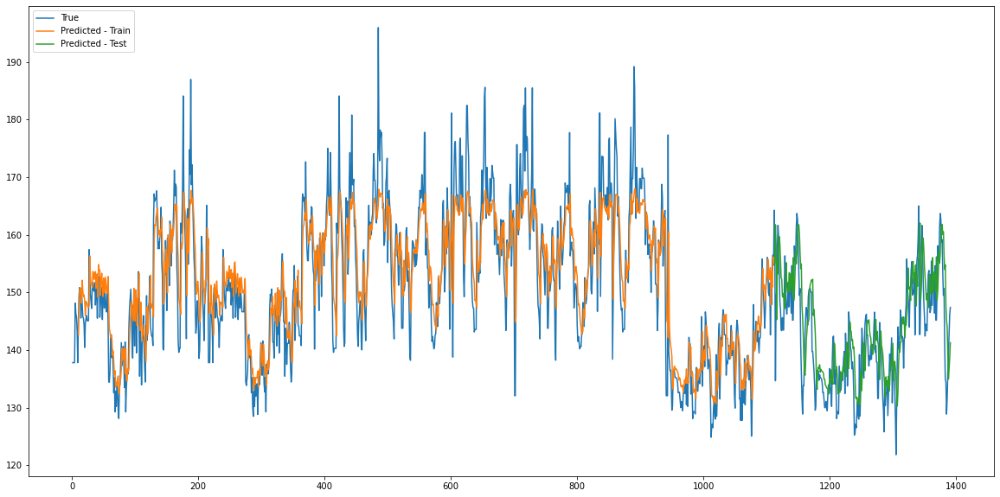

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  450  Iterations:  4059  Loss:  58.846672481960724


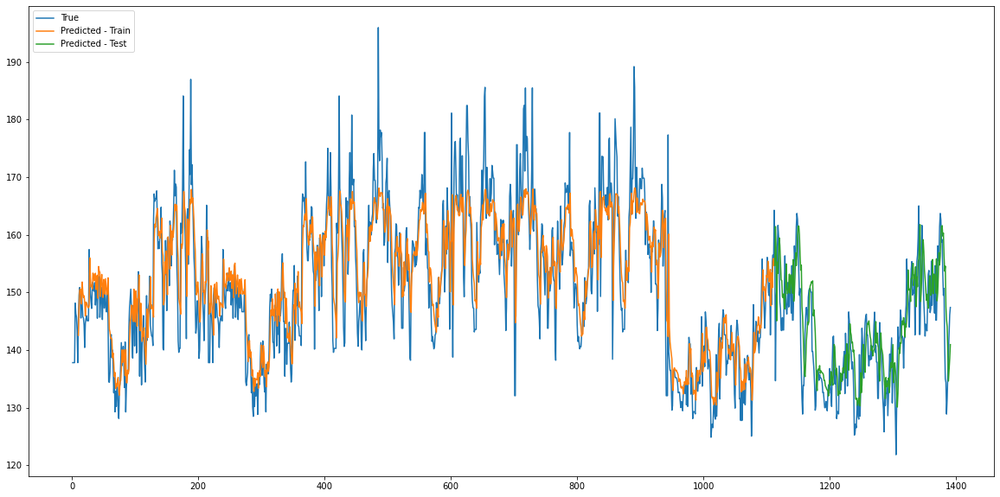

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  460  Iterations:  4149  Loss:  58.78795962863498


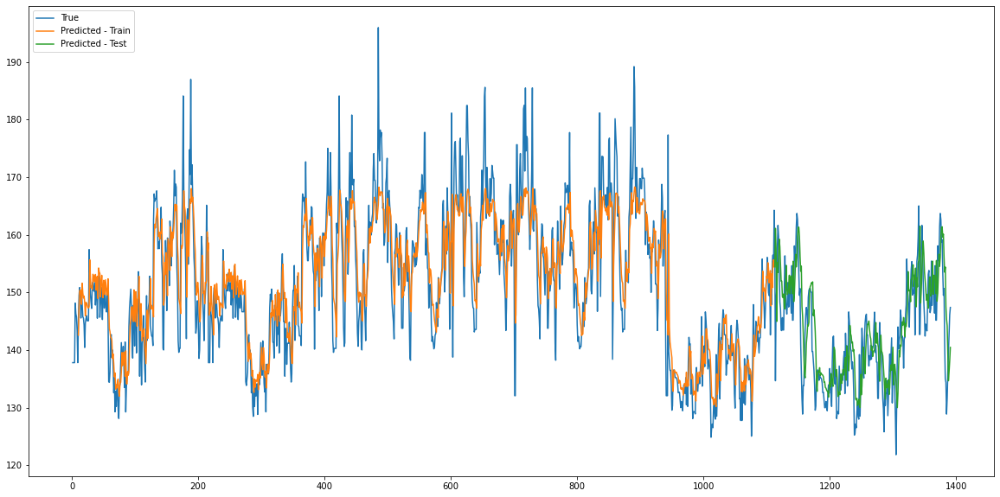

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  470  Iterations:  4239  Loss:  58.415251625908745


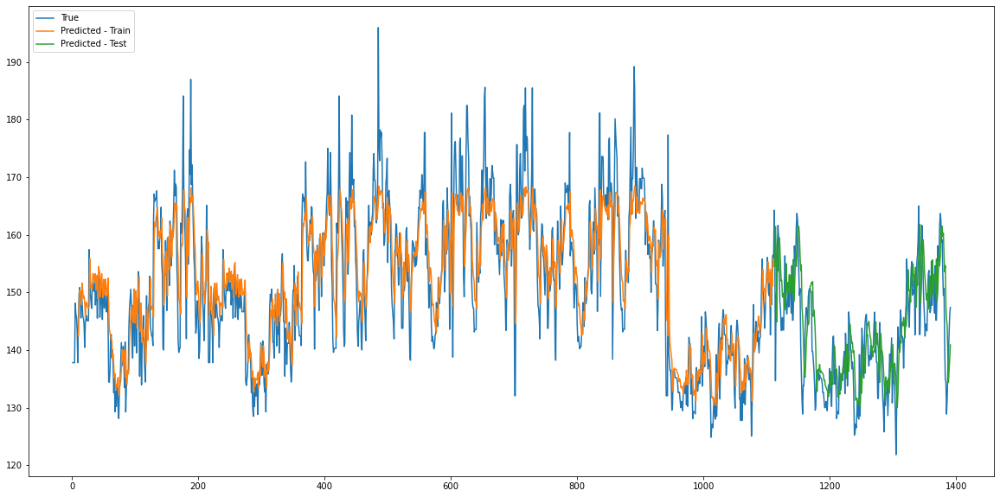

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  480  Iterations:  4329  Loss:  58.21990627712674


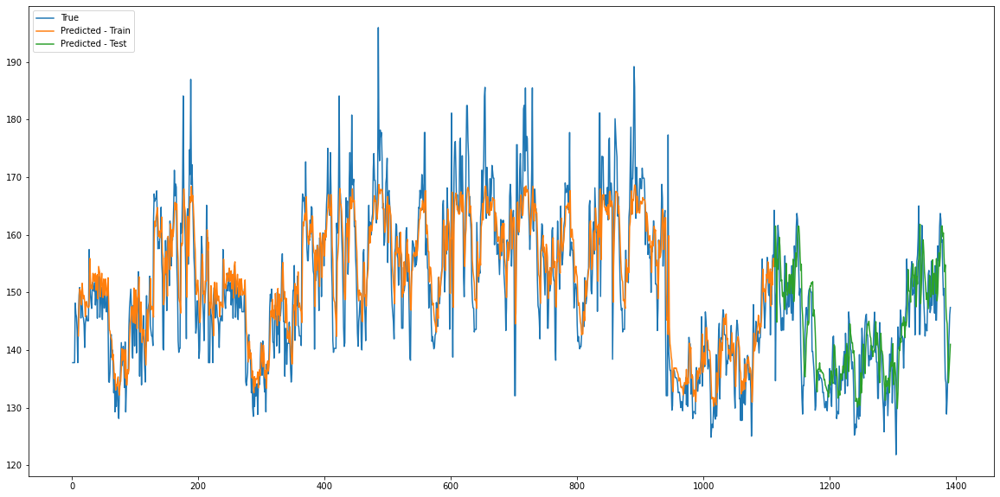

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  490  Iterations:  4419  Loss:  57.98491774664985


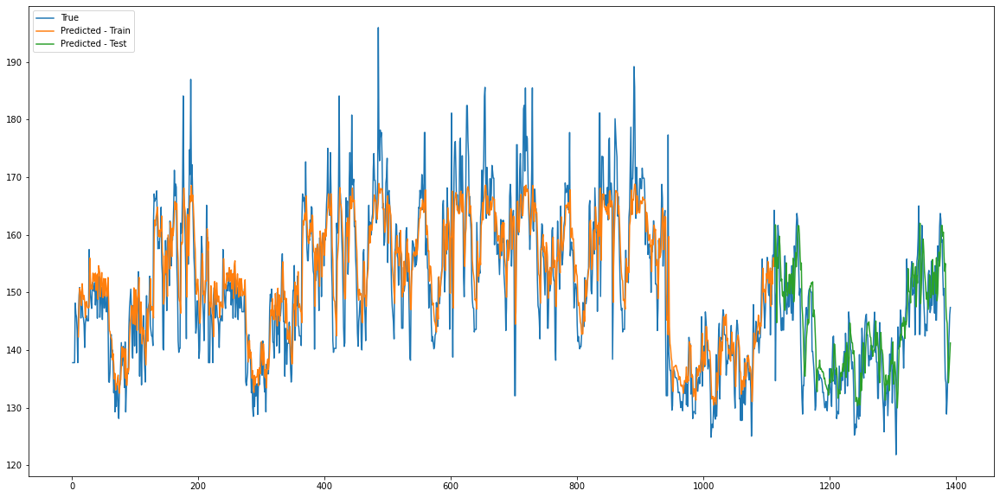

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  500  Iterations:  4509  Loss:  58.117376963297524


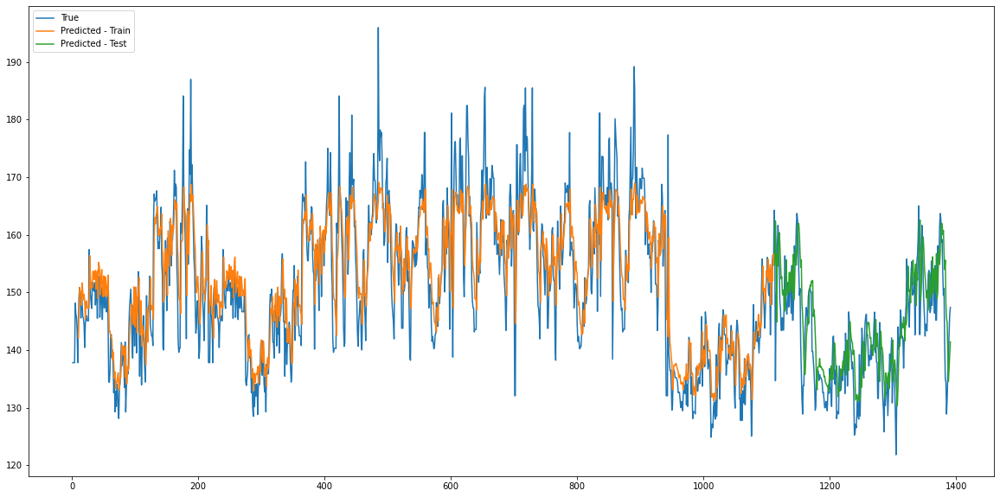

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  510  Iterations:  4599  Loss:  57.53432273864746


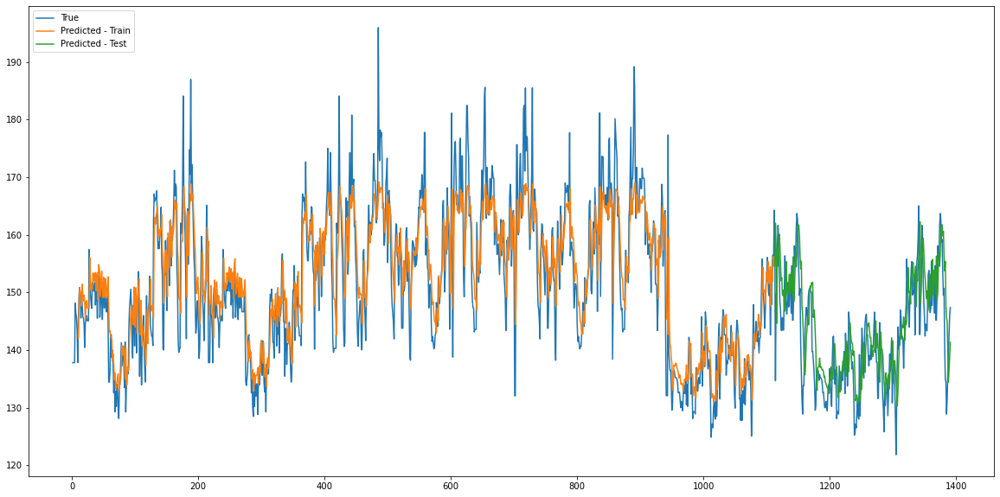

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  520  Iterations:  4689  Loss:  57.37143643697103


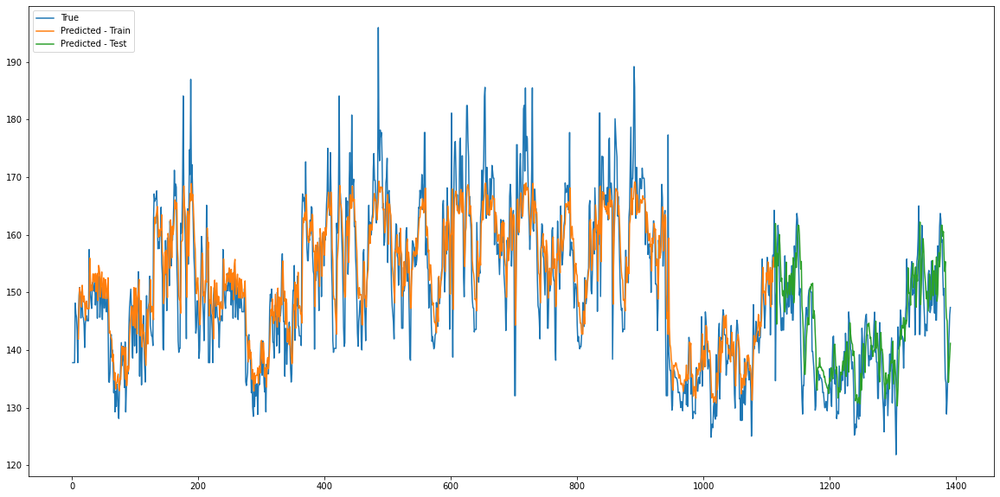

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  530  Iterations:  4779  Loss:  57.14966858757867


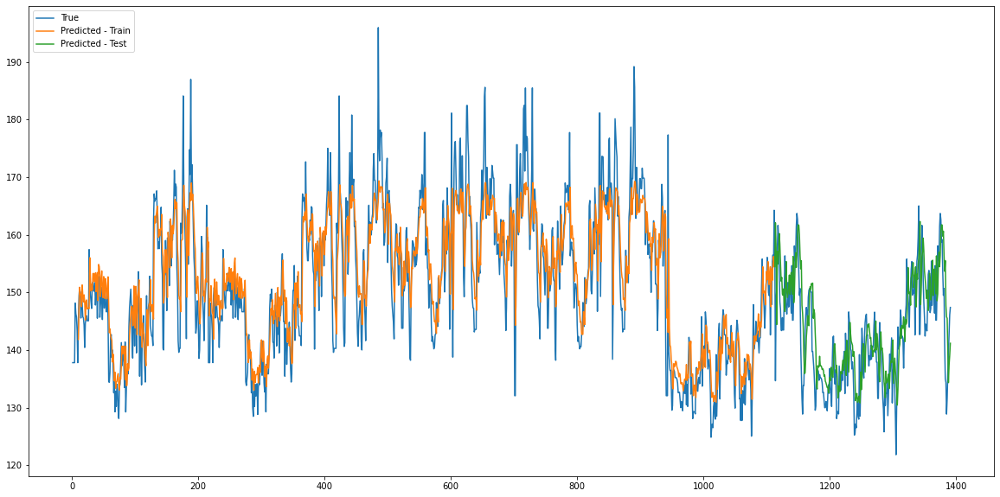

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  540  Iterations:  4869  Loss:  56.96353679233127


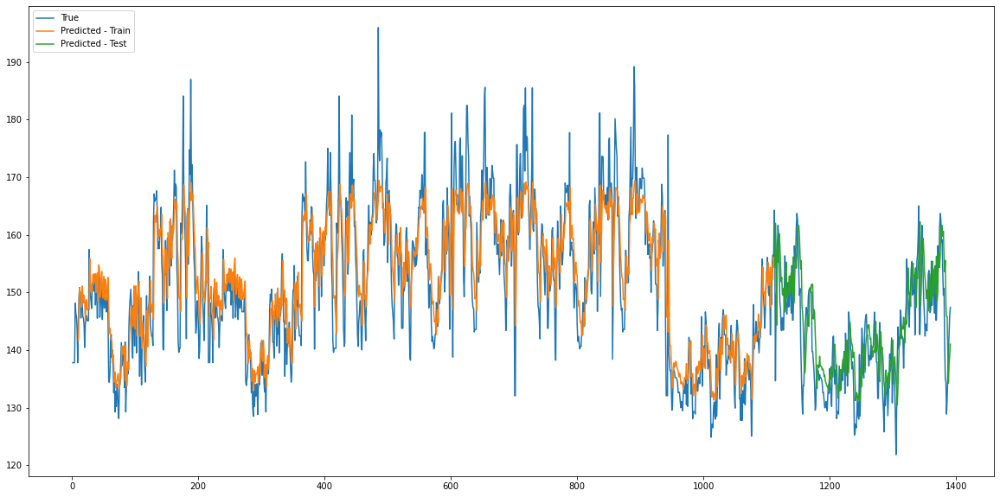

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  550  Iterations:  4959  Loss:  56.68814553154839


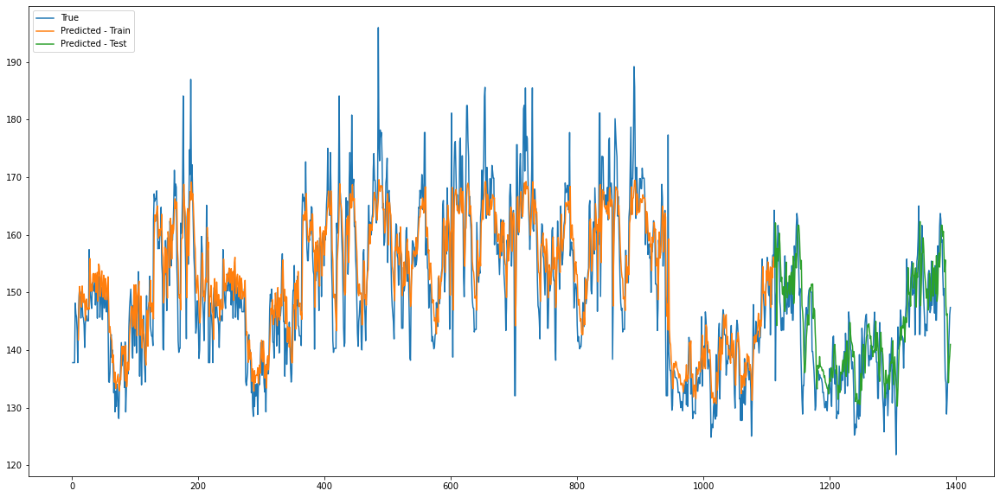

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  560  Iterations:  5049  Loss:  56.59844716389974


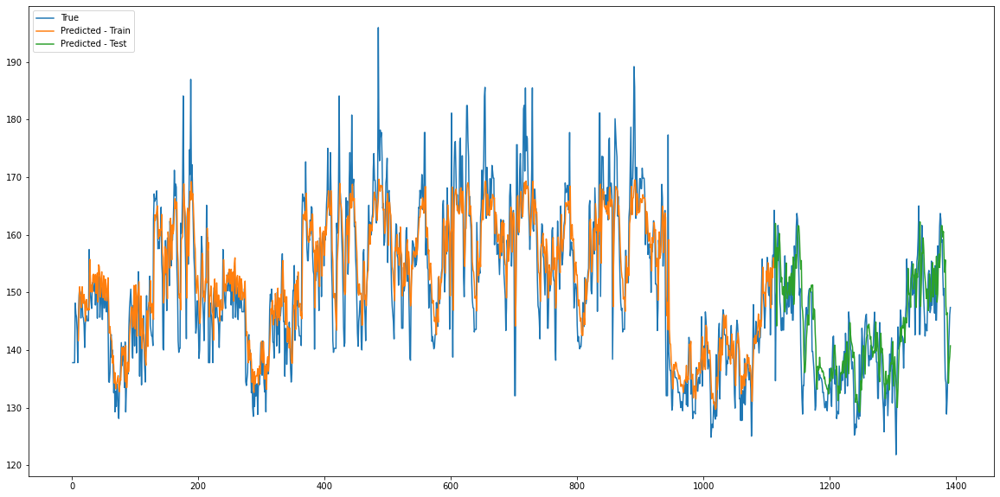

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  570  Iterations:  5139  Loss:  56.2686710357666


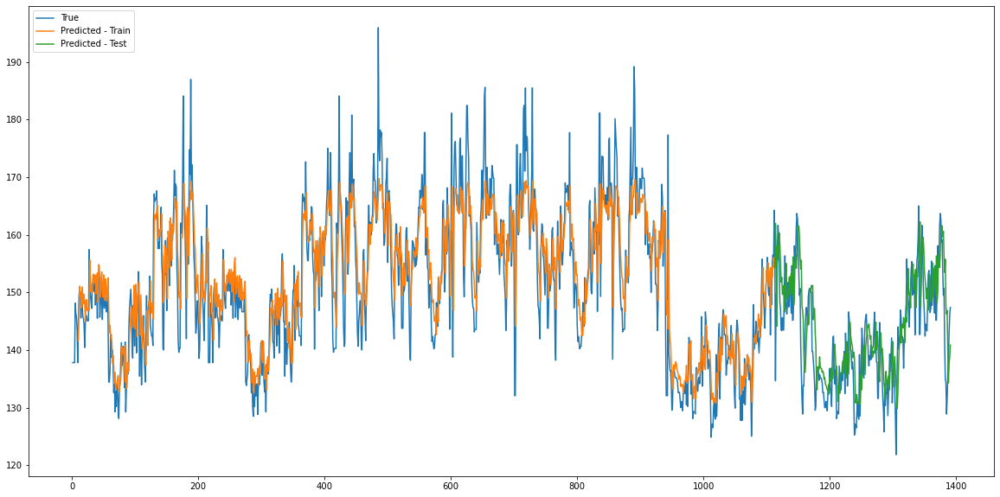

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  580  Iterations:  5229  Loss:  56.228865729437935


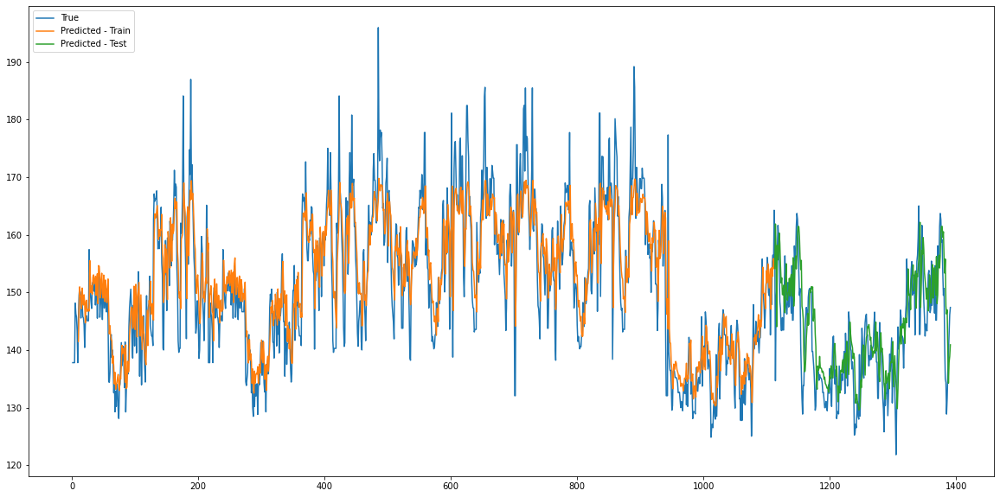

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  590  Iterations:  5319  Loss:  56.197014490763344


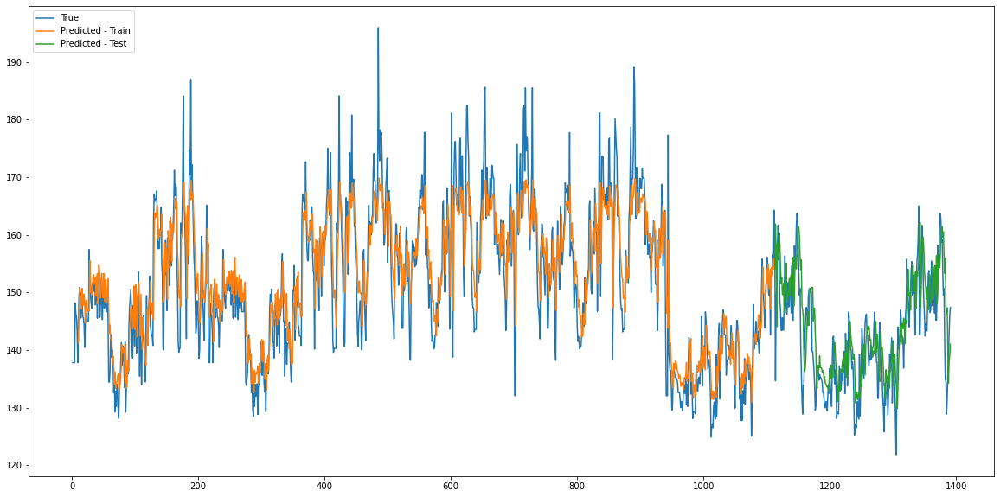

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  600  Iterations:  5409  Loss:  55.96544626024034


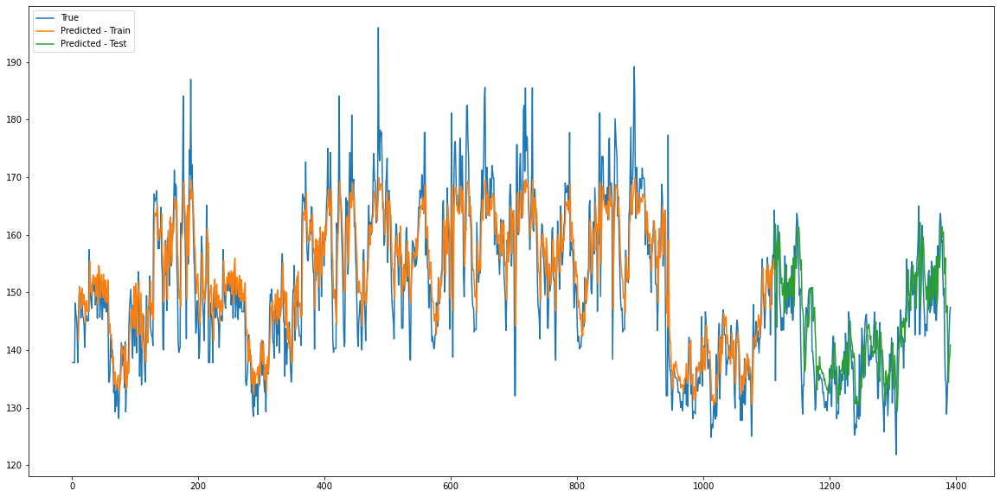

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  610  Iterations:  5499  Loss:  55.76554319593642


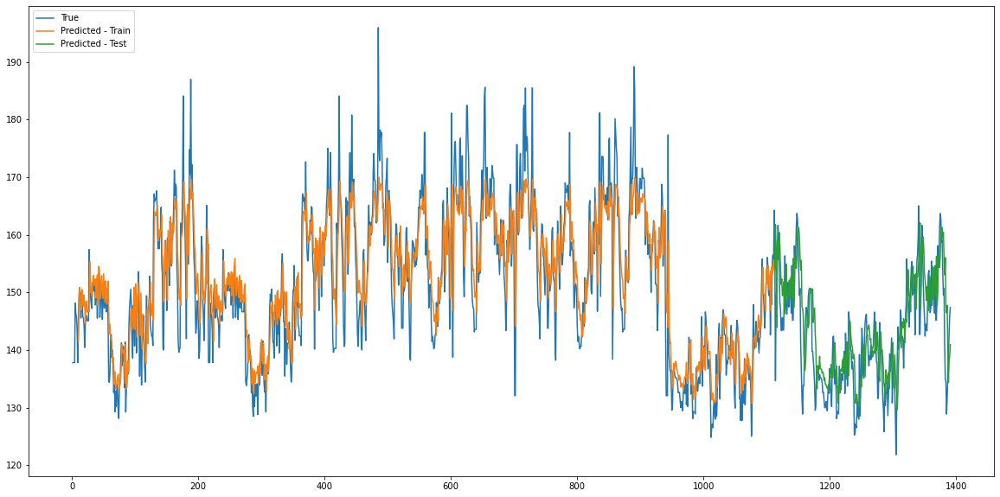

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  620  Iterations:  5589  Loss:  55.59357939826118


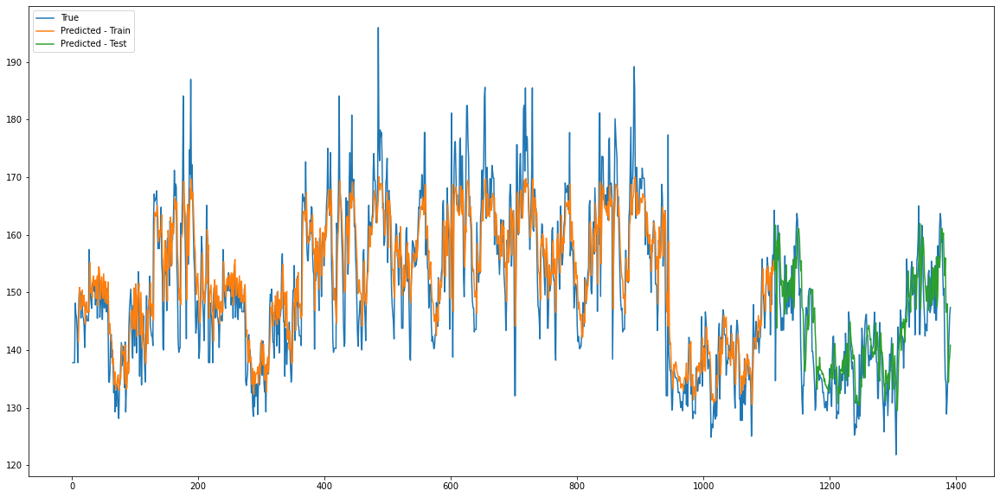

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  630  Iterations:  5679  Loss:  55.34727478027344


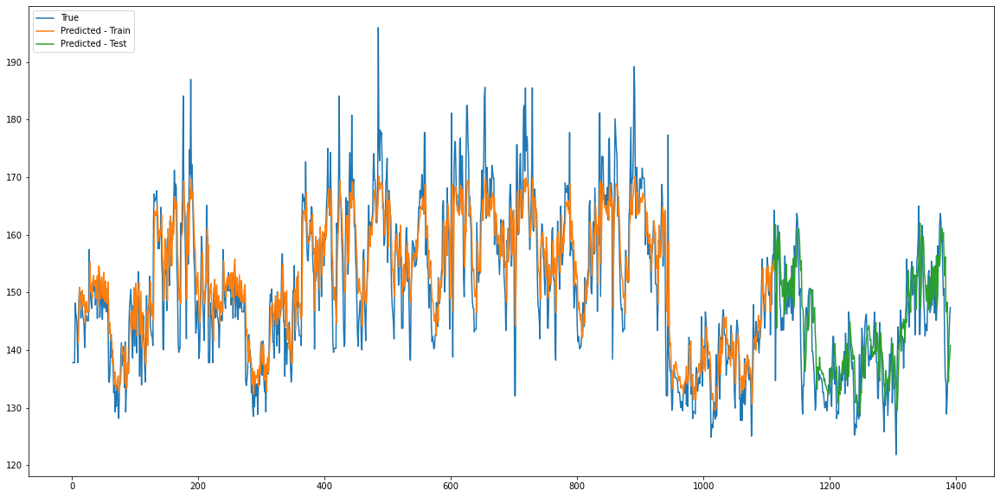

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  640  Iterations:  5769  Loss:  55.49433199564616


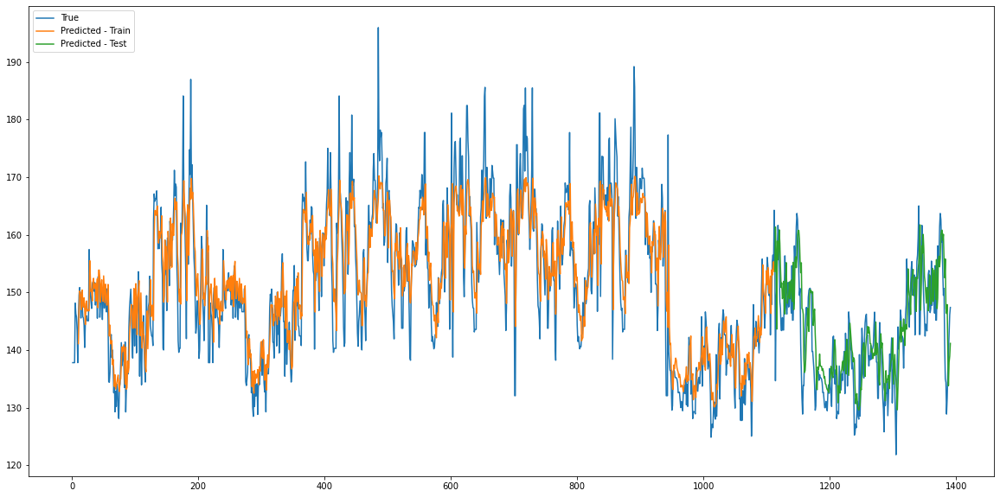

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  650  Iterations:  5859  Loss:  54.89672745598687


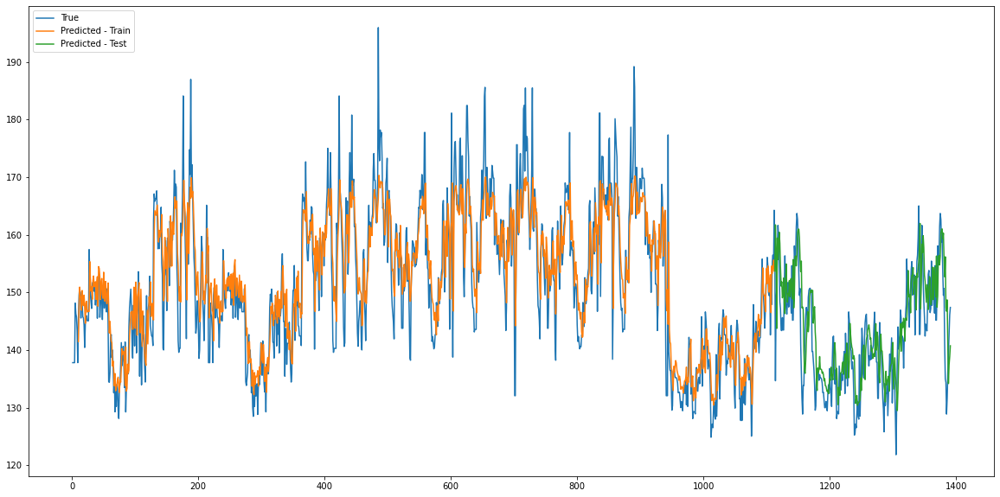

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  660  Iterations:  5949  Loss:  54.77269744873047


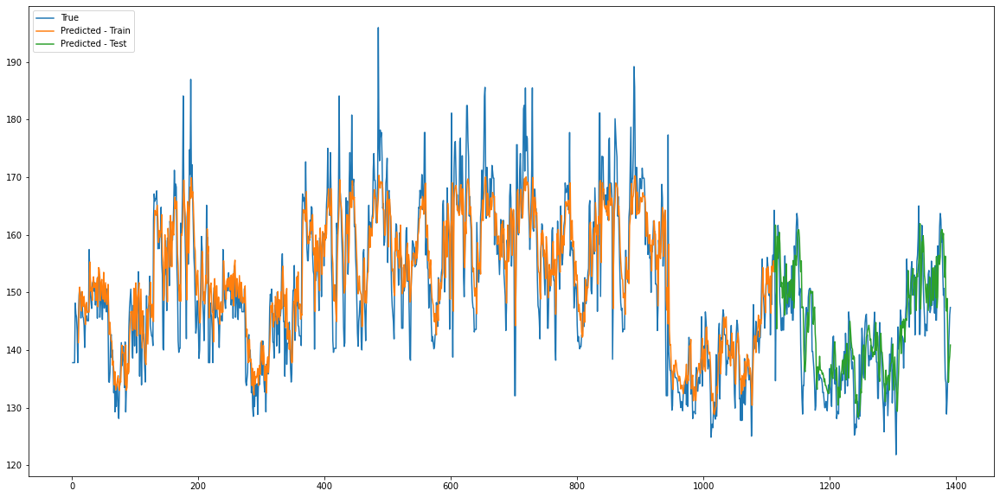

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  670  Iterations:  6039  Loss:  54.94888835483127


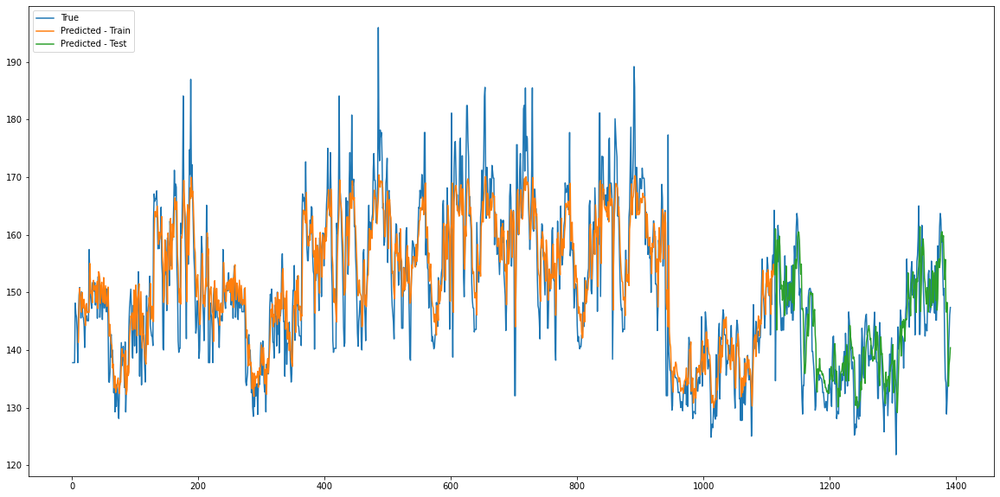

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  680  Iterations:  6129  Loss:  55.215616650051544


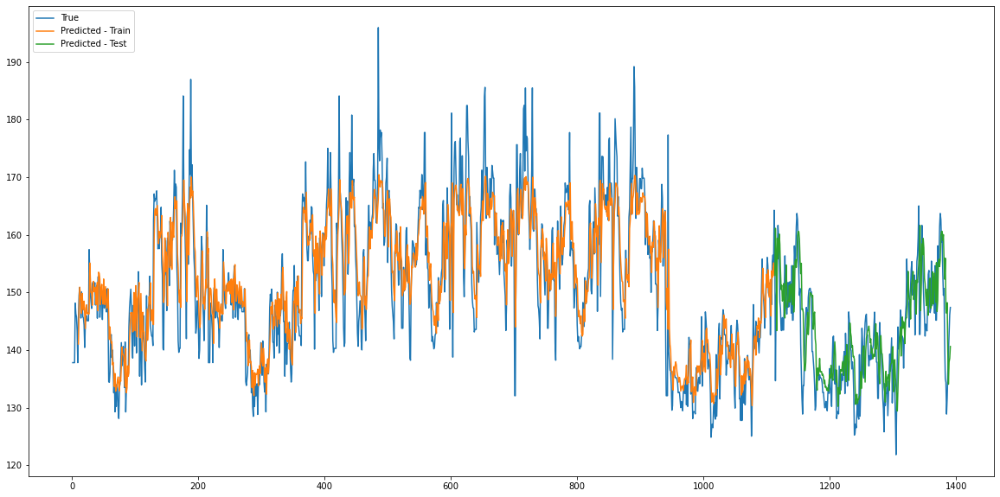

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  690  Iterations:  6219  Loss:  54.31991216871474


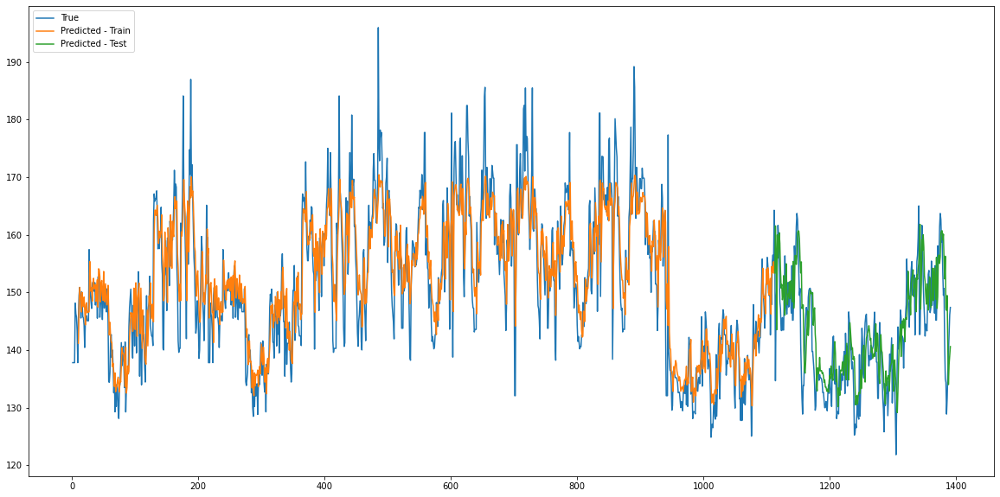

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  700  Iterations:  6309  Loss:  54.562658098008896


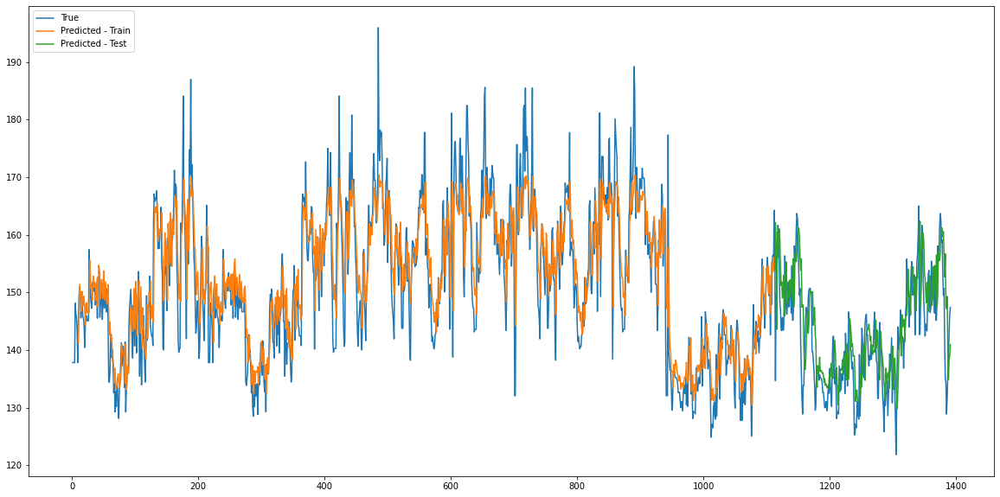

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  710  Iterations:  6399  Loss:  54.8623161315918


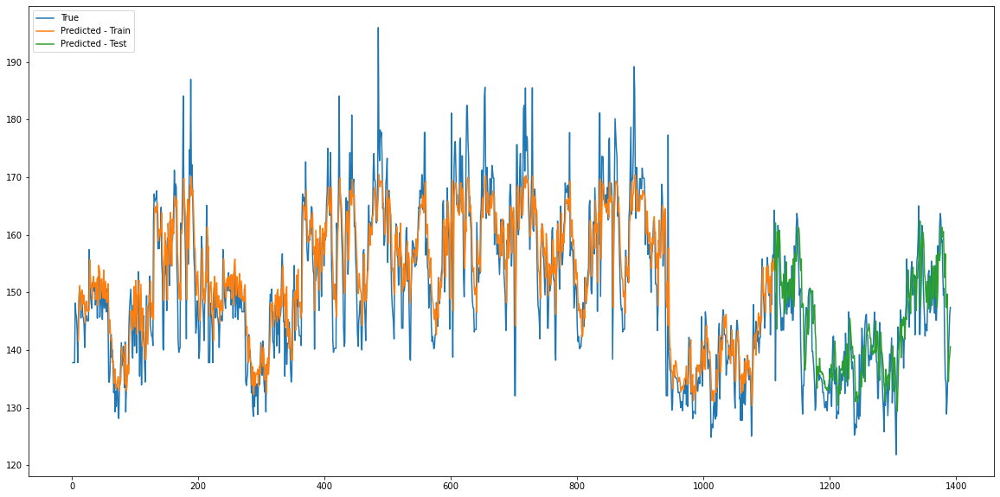

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  720  Iterations:  6489  Loss:  54.78965610928006


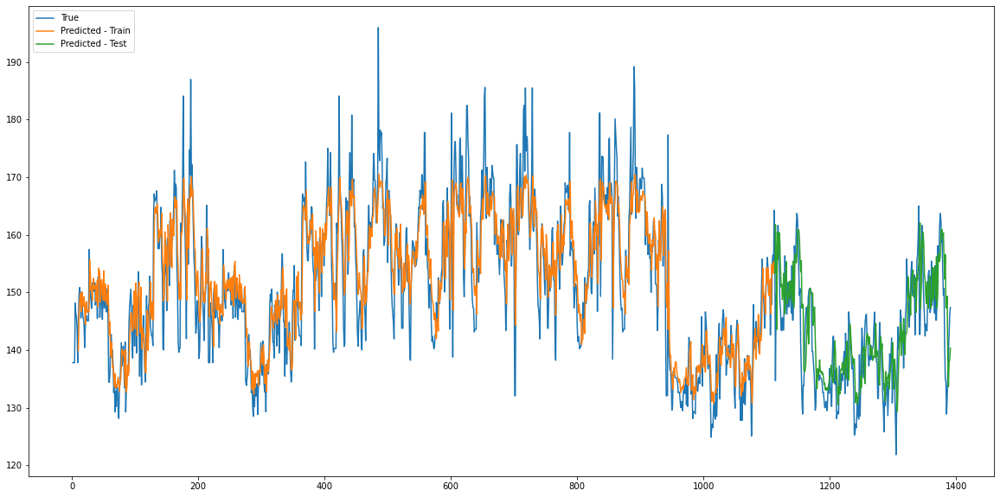

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  730  Iterations:  6579  Loss:  53.838938819037544


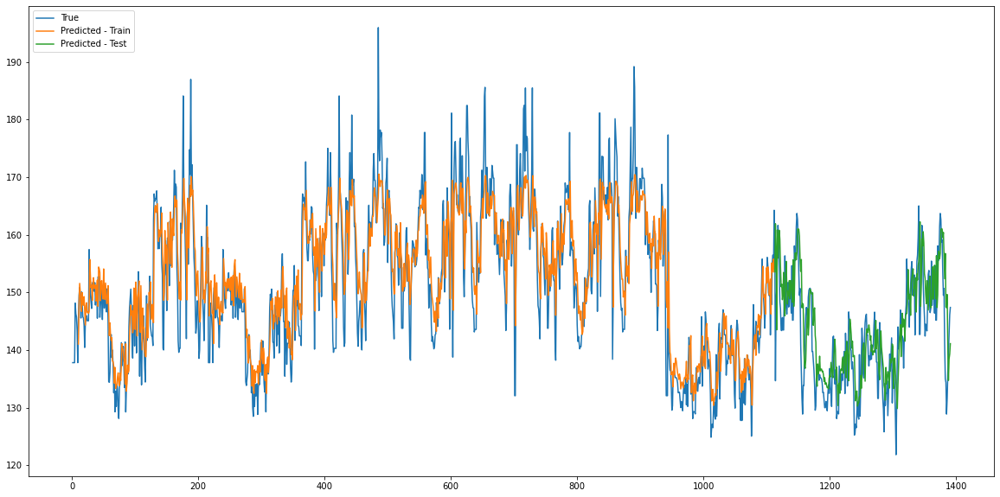

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  740  Iterations:  6669  Loss:  54.027528550889755


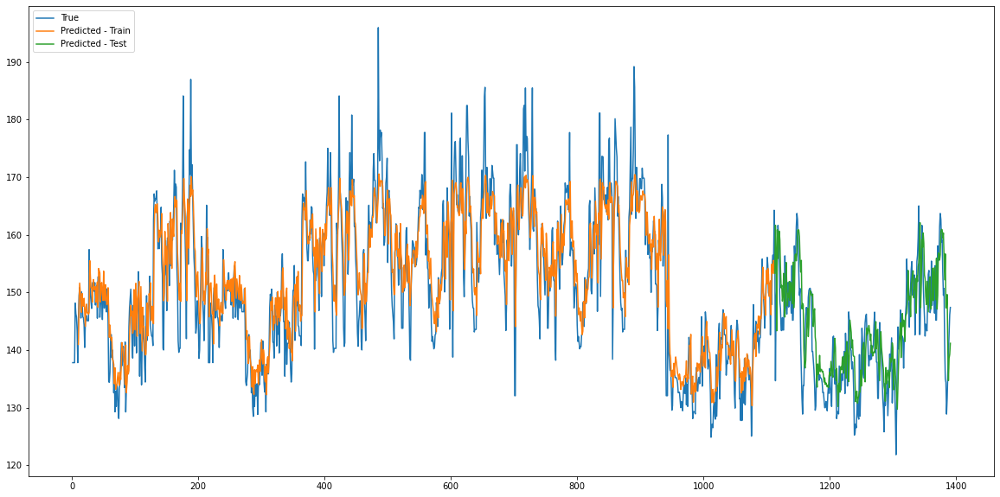

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  750  Iterations:  6759  Loss:  53.57949214511447


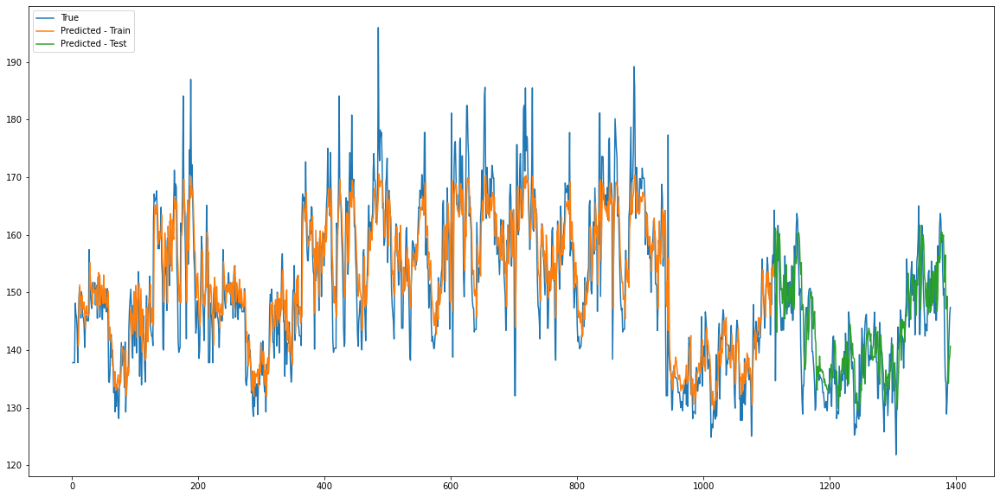

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  760  Iterations:  6849  Loss:  53.55265447828505


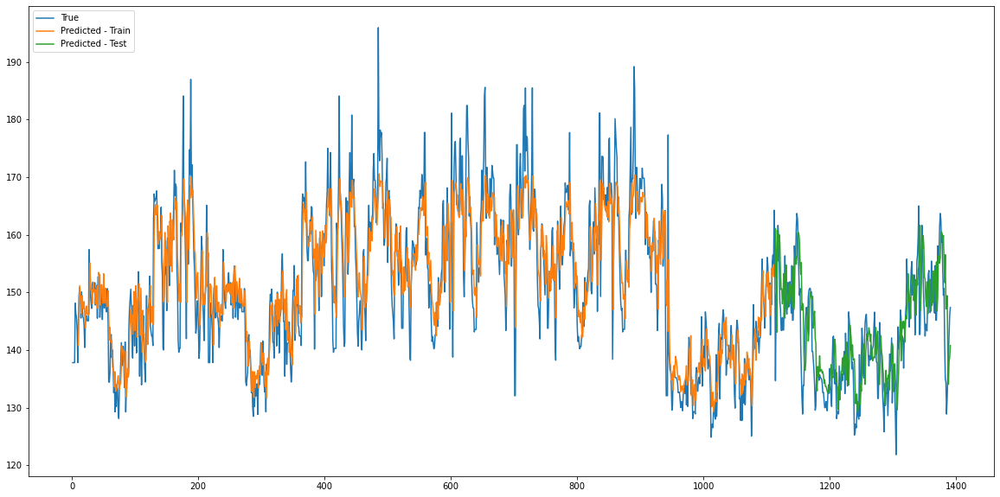

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  770  Iterations:  6939  Loss:  53.506308025783966


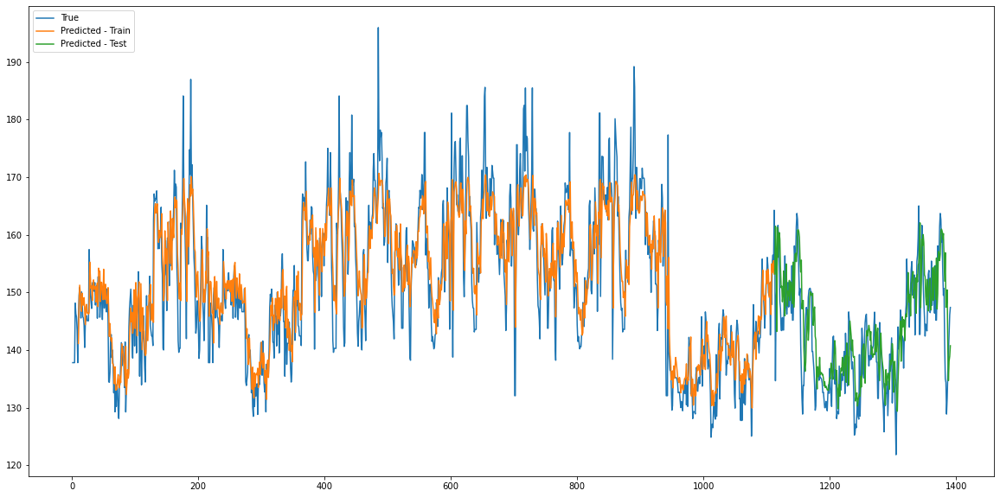

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  780  Iterations:  7029  Loss:  53.33514192369249


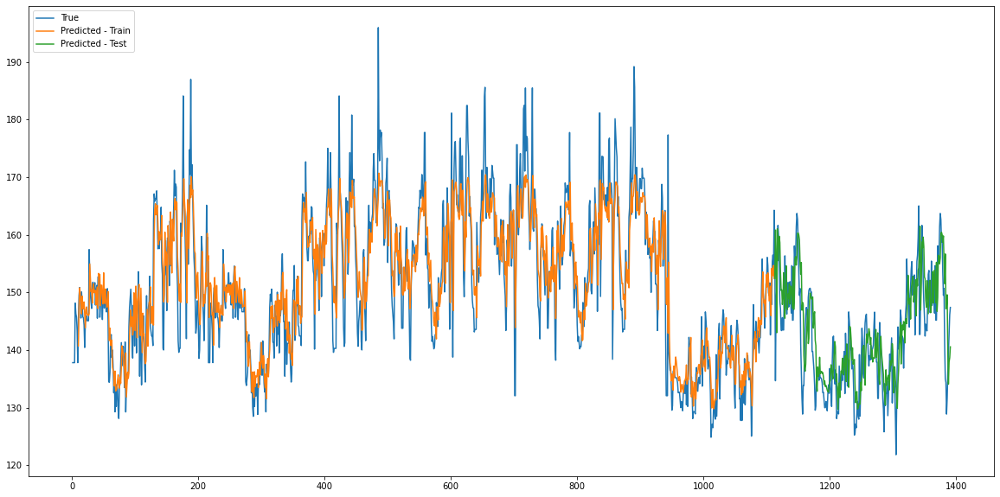

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  790  Iterations:  7119  Loss:  53.25239033169217


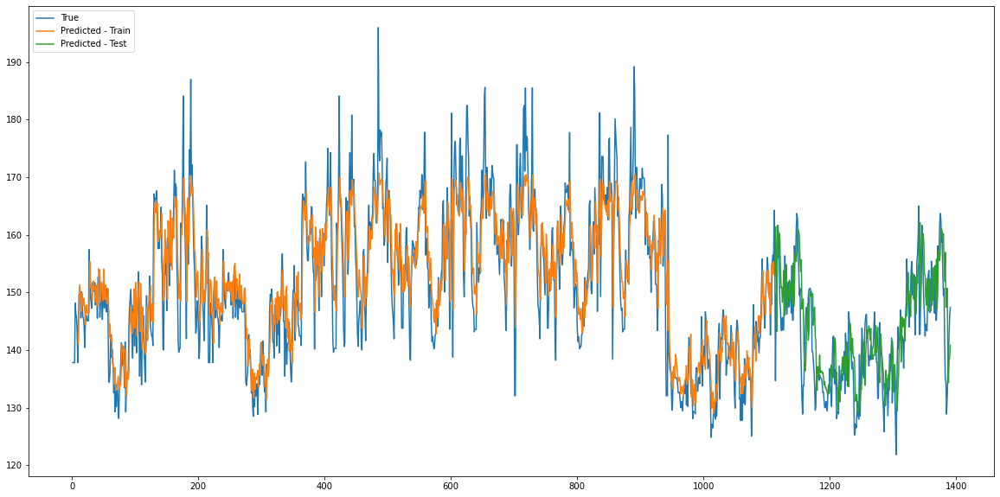

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  800  Iterations:  7209  Loss:  52.88462003072103


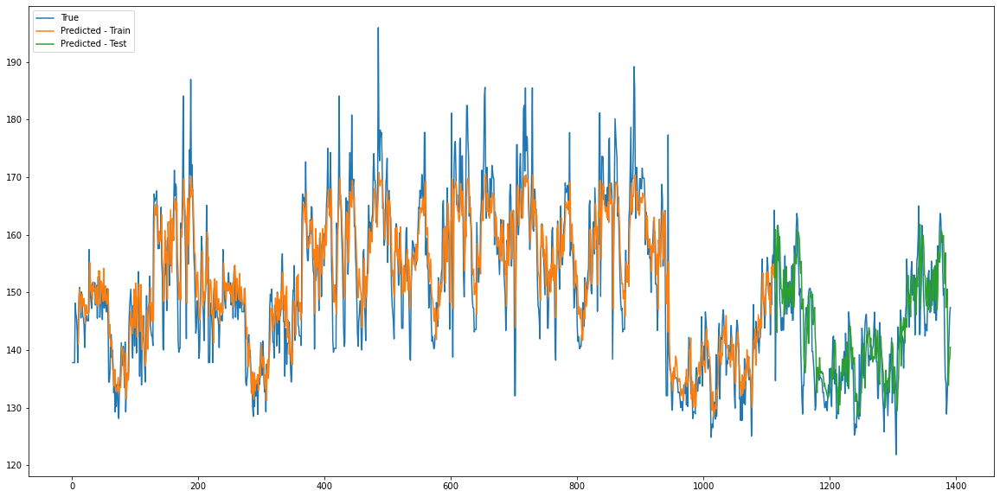

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  810  Iterations:  7299  Loss:  53.38439326816135


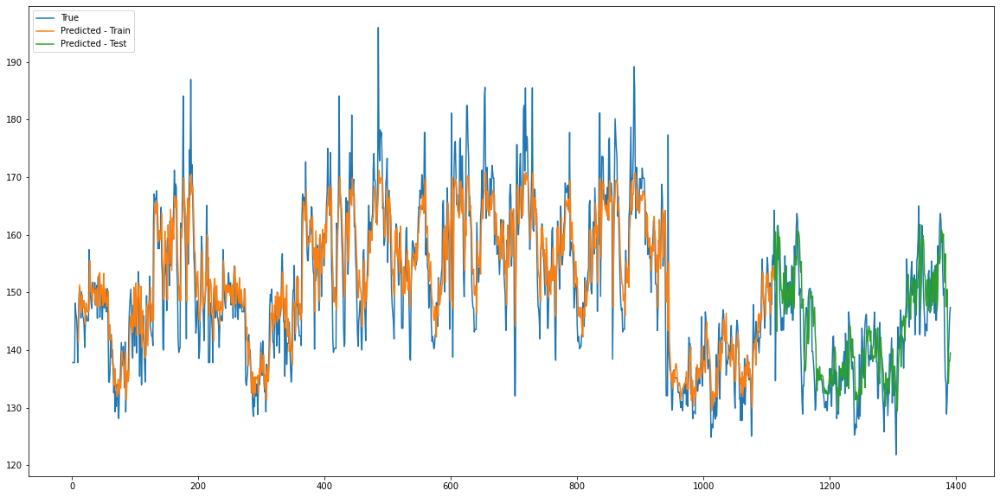

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  820  Iterations:  7389  Loss:  52.02038065592448


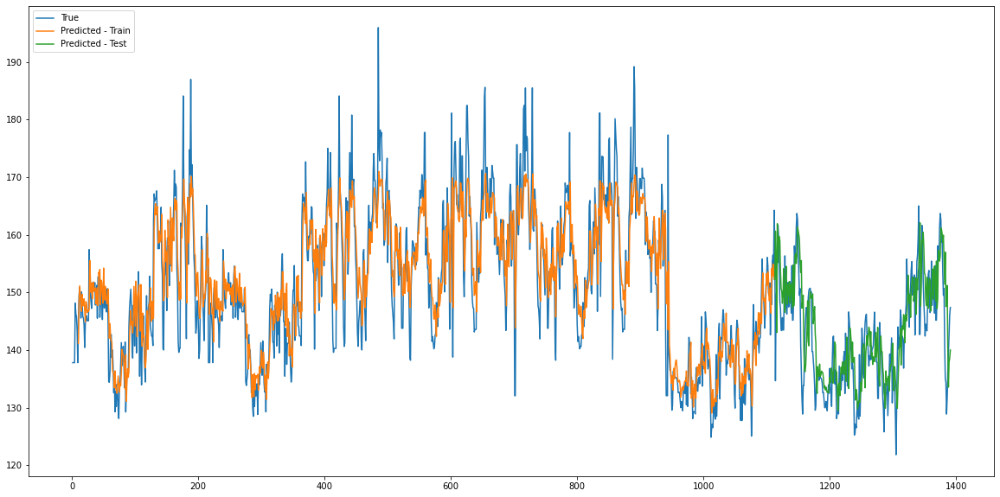

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  830  Iterations:  7479  Loss:  51.82591586642795


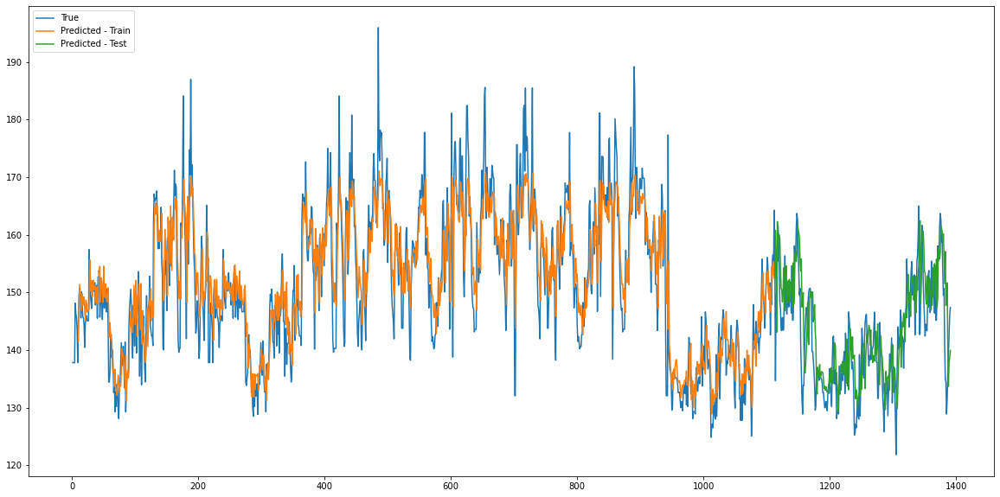

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  840  Iterations:  7569  Loss:  51.54868380228678


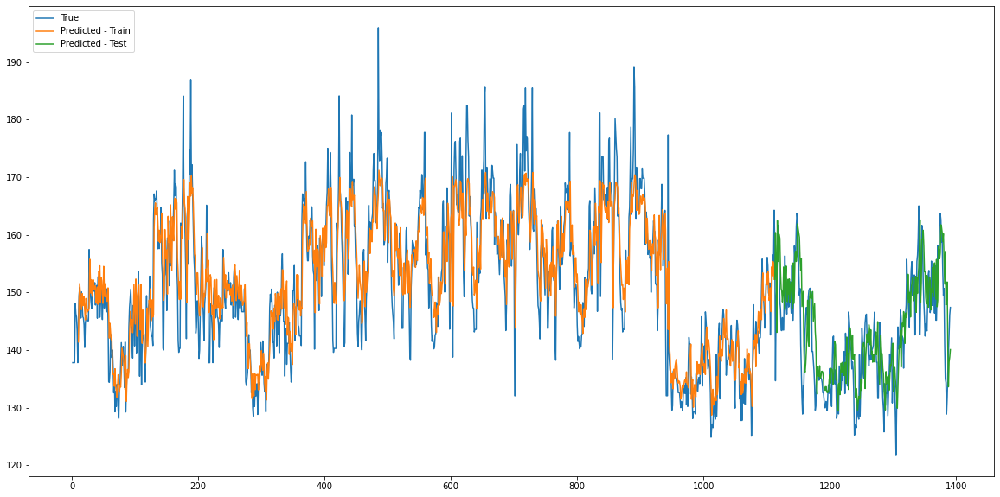

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  850  Iterations:  7659  Loss:  51.39671664767795


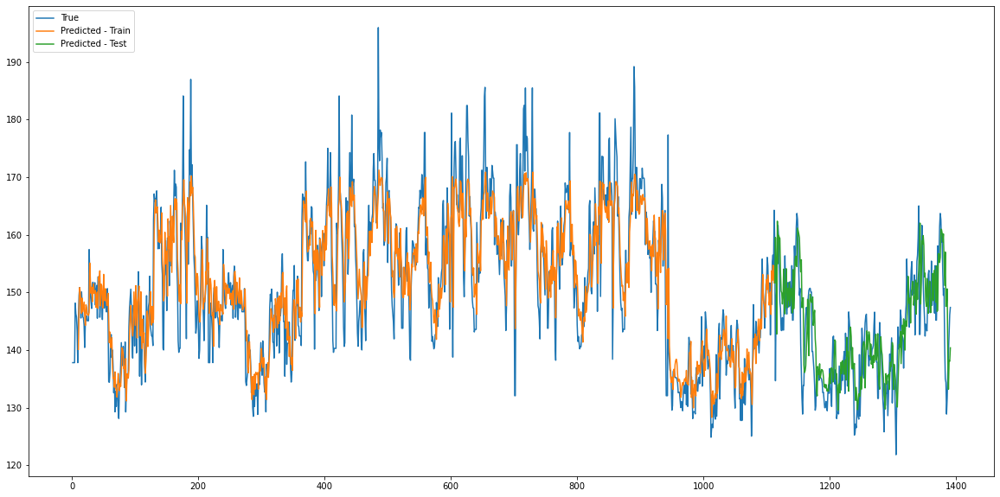

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  860  Iterations:  7749  Loss:  51.1404185824924


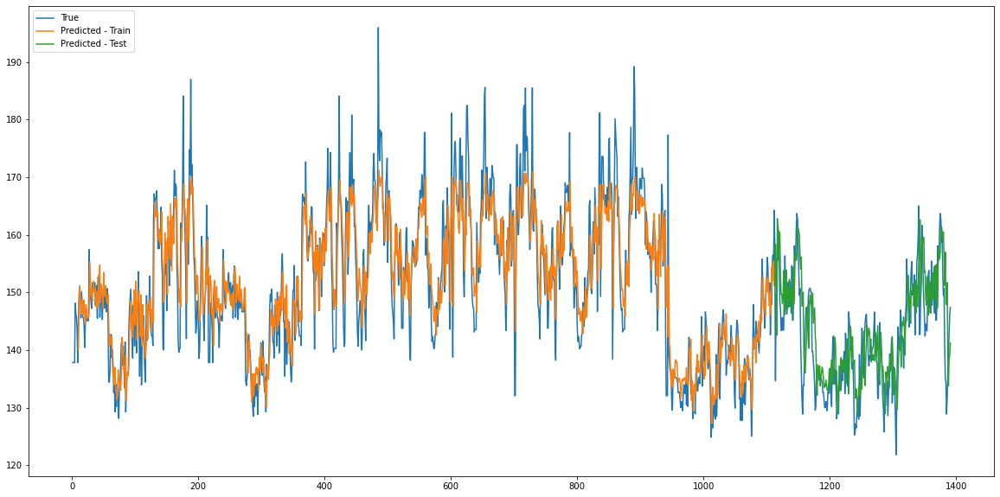

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  870  Iterations:  7839  Loss:  53.95599238077799


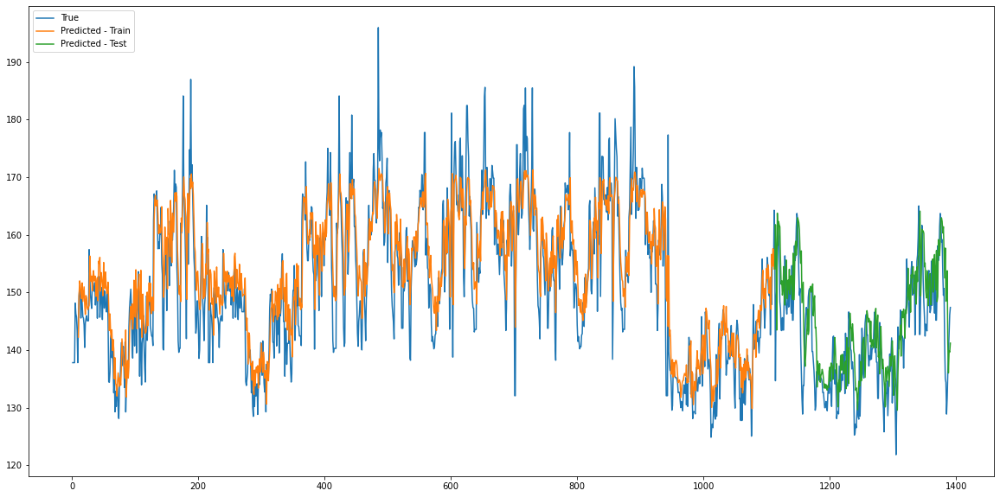

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  880  Iterations:  7929  Loss:  51.547506968180336


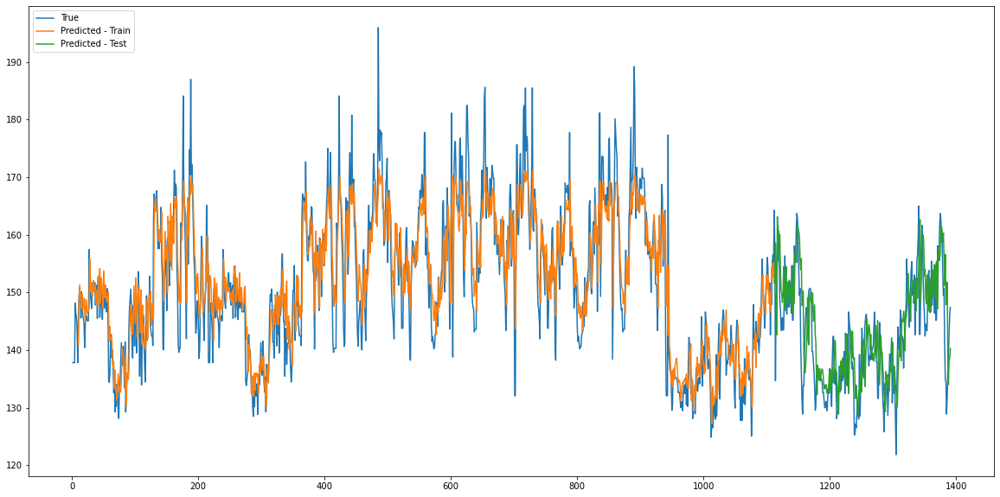

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  890  Iterations:  8019  Loss:  50.654629177517364


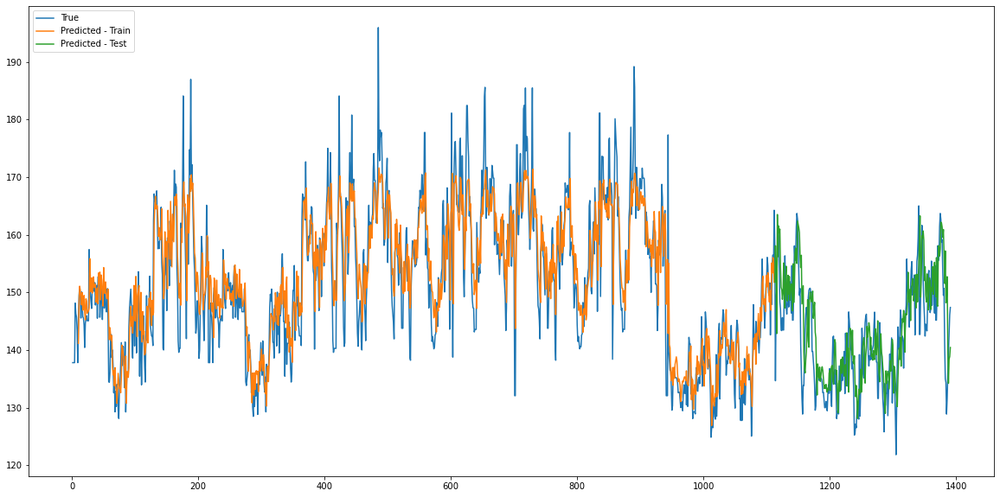

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  900  Iterations:  8109  Loss:  50.17719374762641


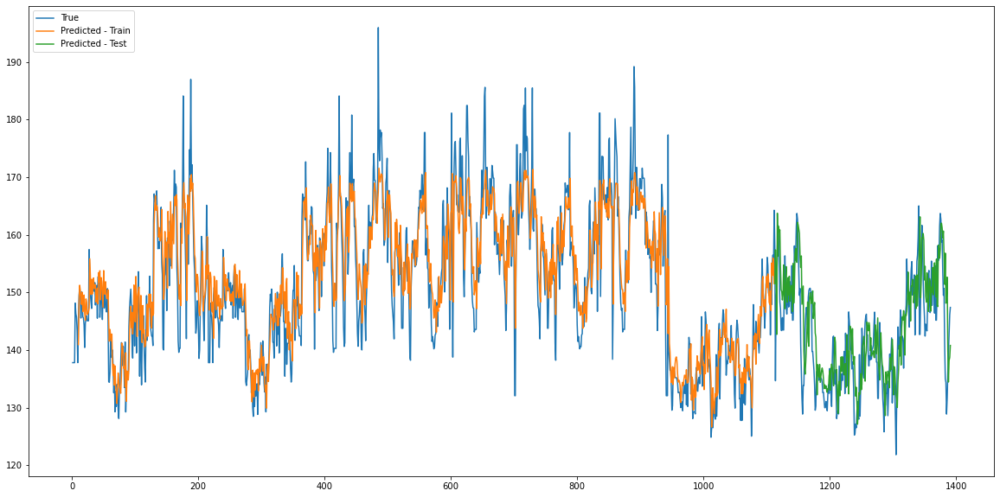

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  910  Iterations:  8199  Loss:  50.72613949245877


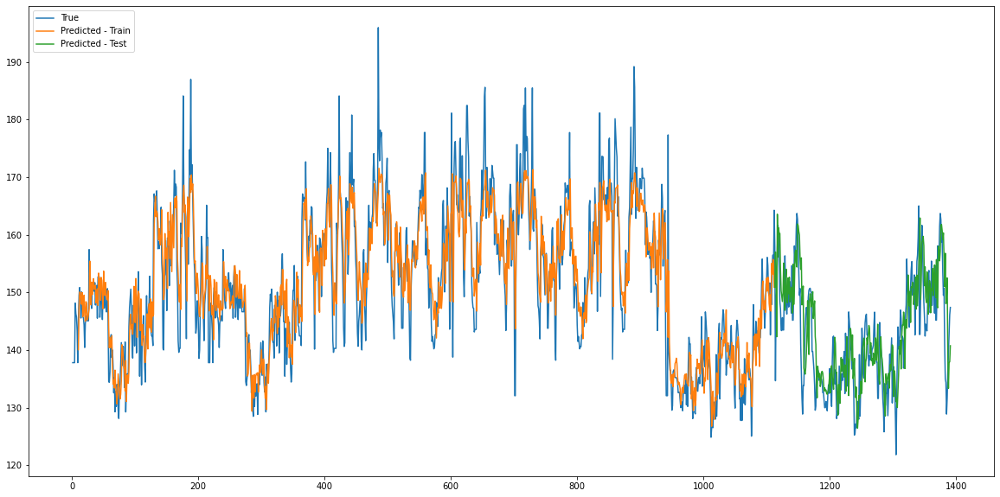

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  920  Iterations:  8289  Loss:  51.024425718519424


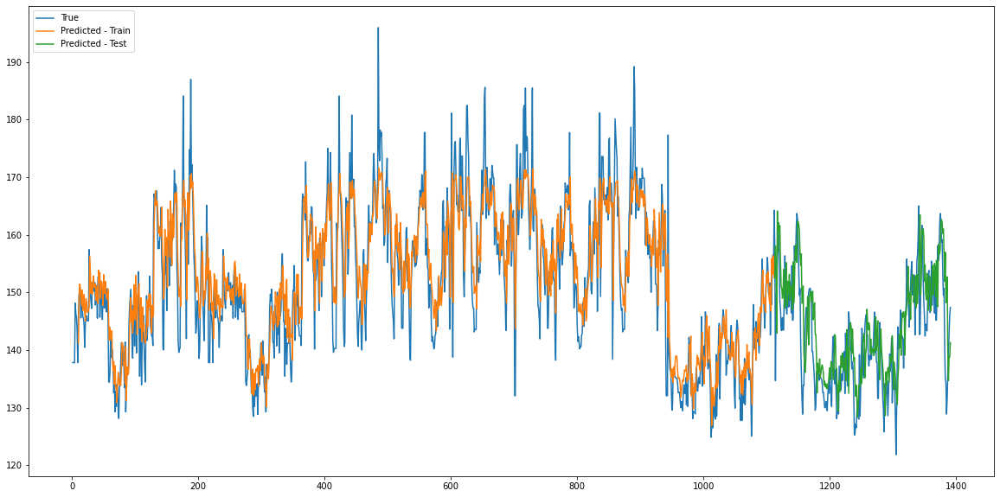

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  930  Iterations:  8379  Loss:  49.89891115824381


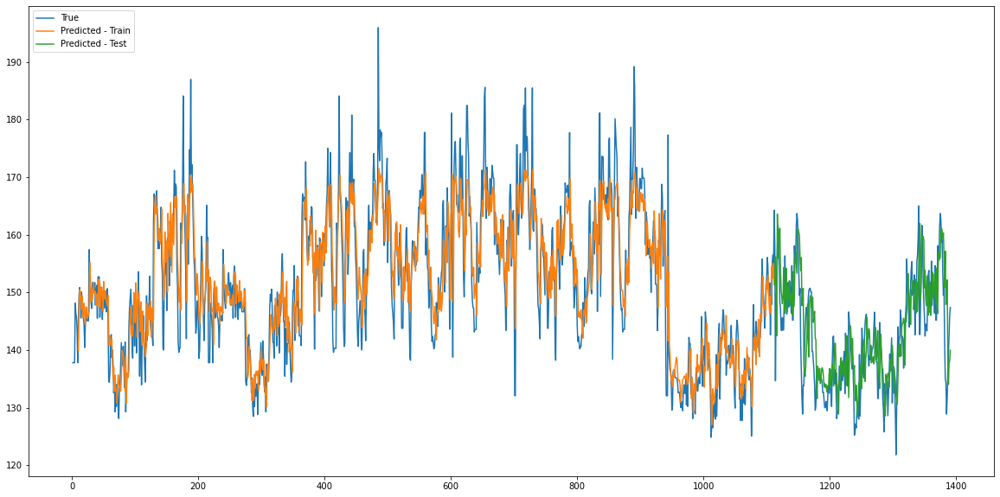

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  940  Iterations:  8469  Loss:  50.23925378587511


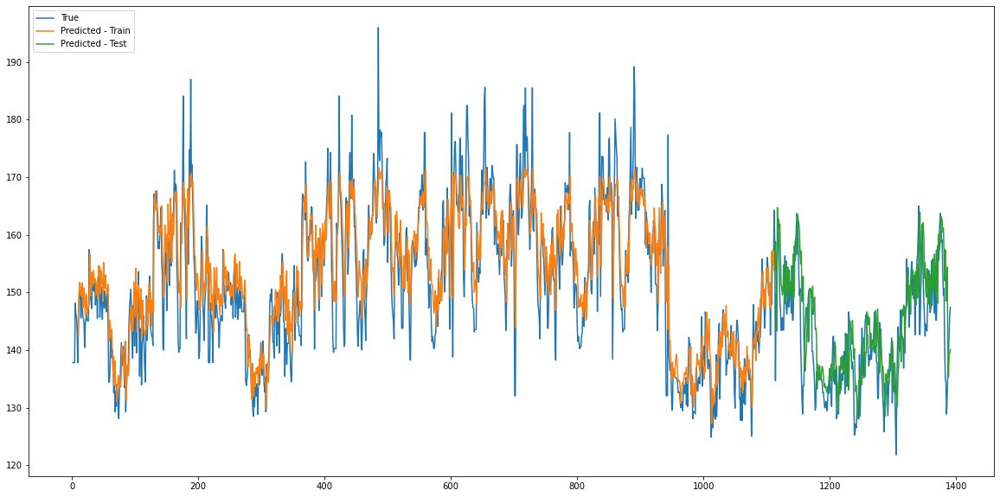

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  950  Iterations:  8559  Loss:  49.03902922736274


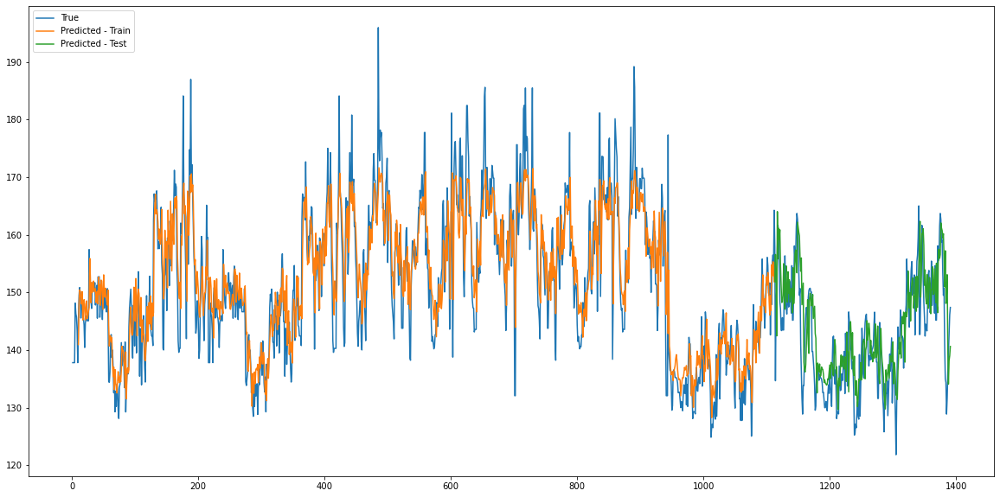

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  960  Iterations:  8649  Loss:  49.87554465399848


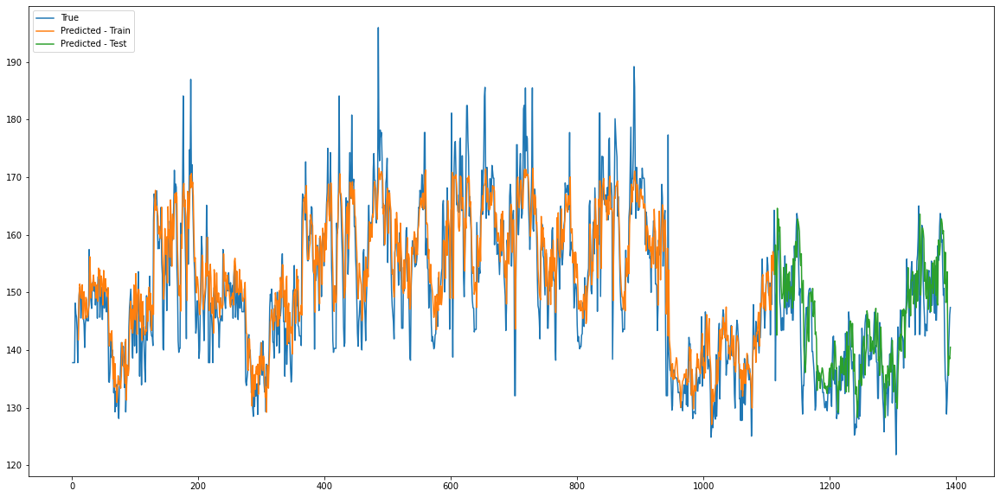

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  970  Iterations:  8739  Loss:  49.07624520195855


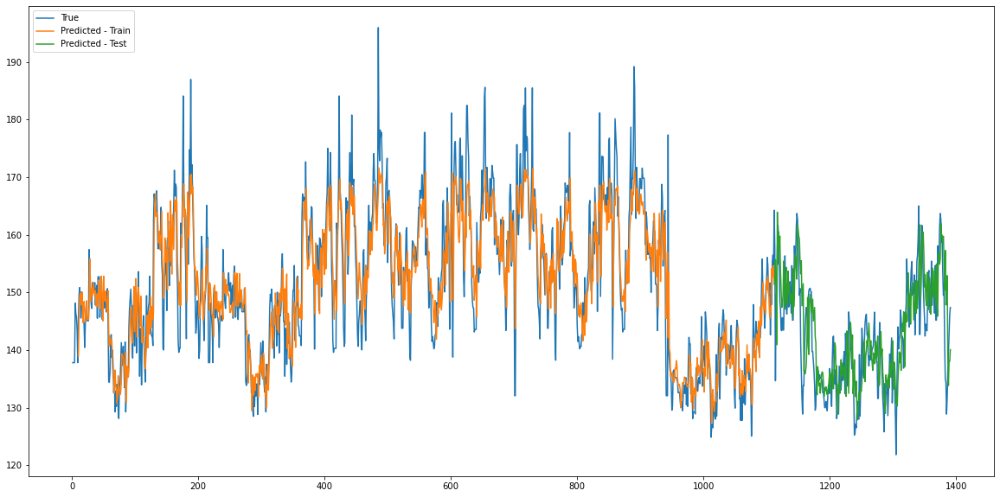

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  980  Iterations:  8829  Loss:  50.827050315009224


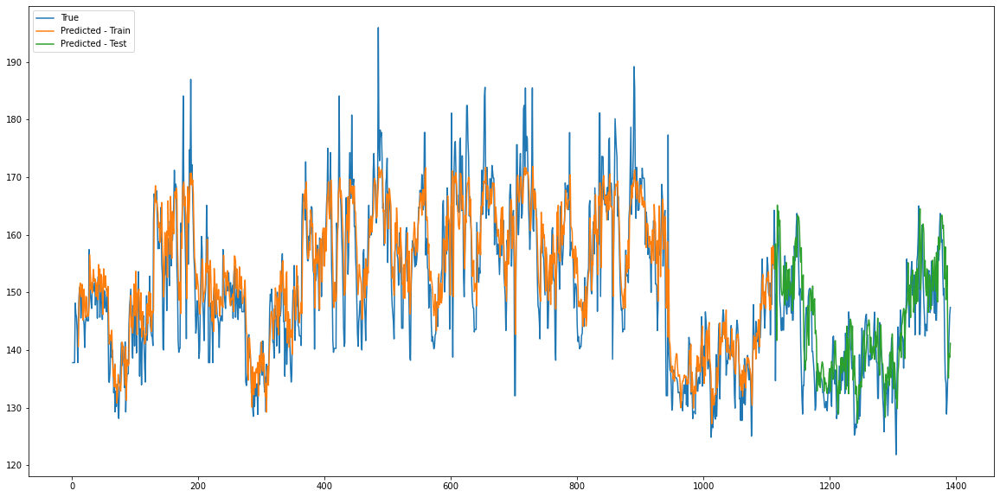

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


Epochs:  990  Iterations:  8919  Loss:  48.56194072299533


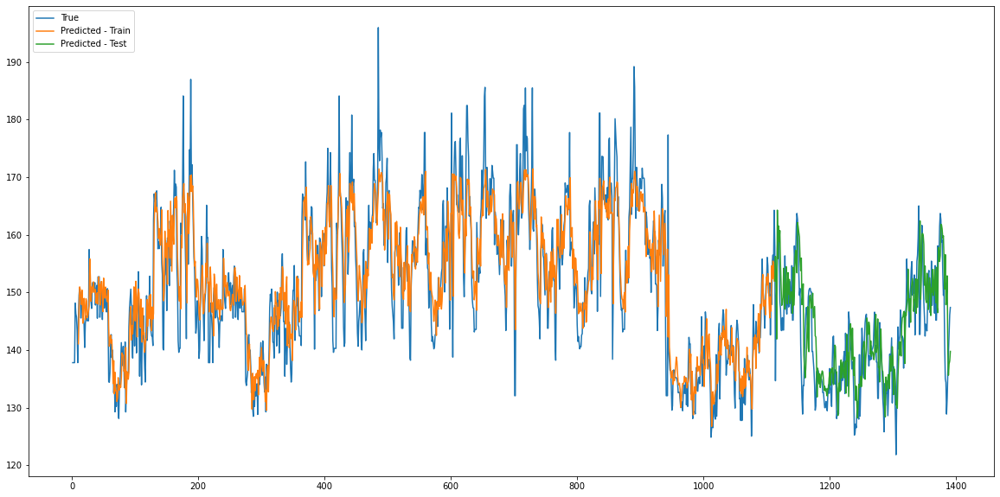

/tmp/ipykernel_1627139/450843384.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/450843384.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


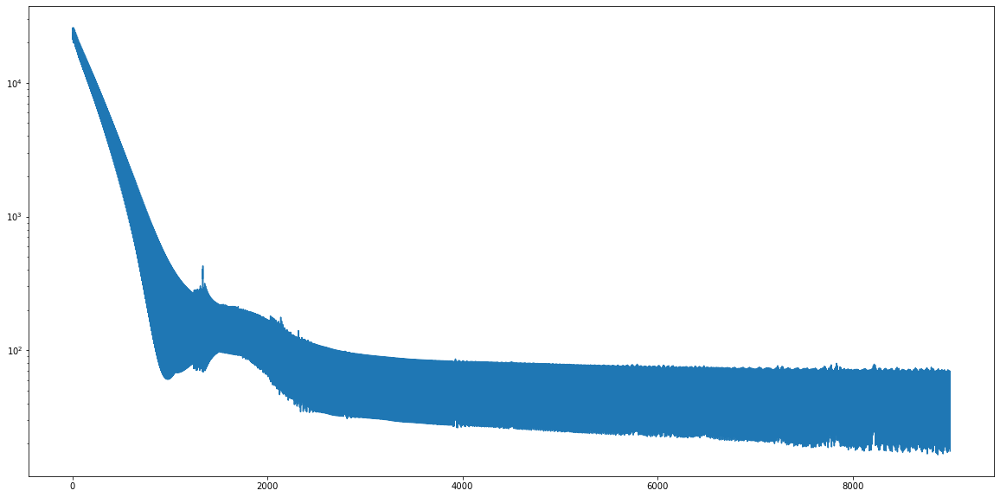

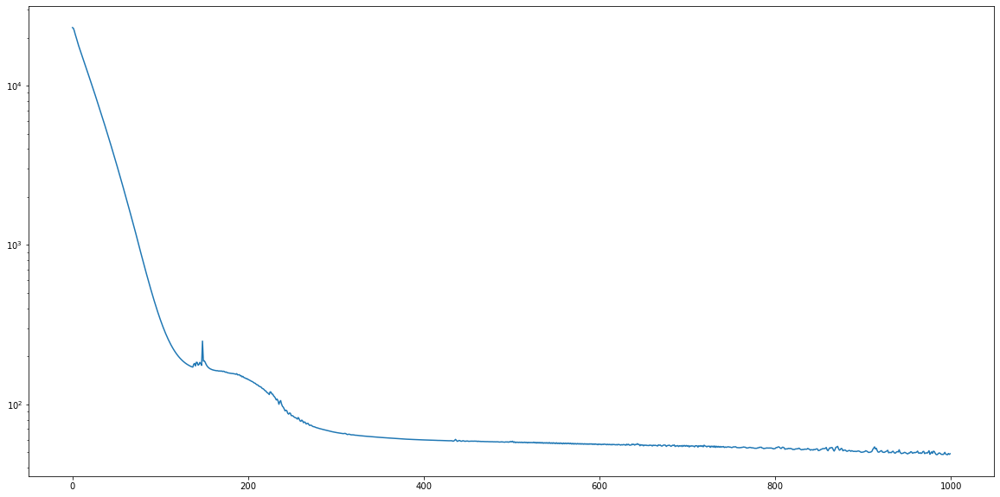

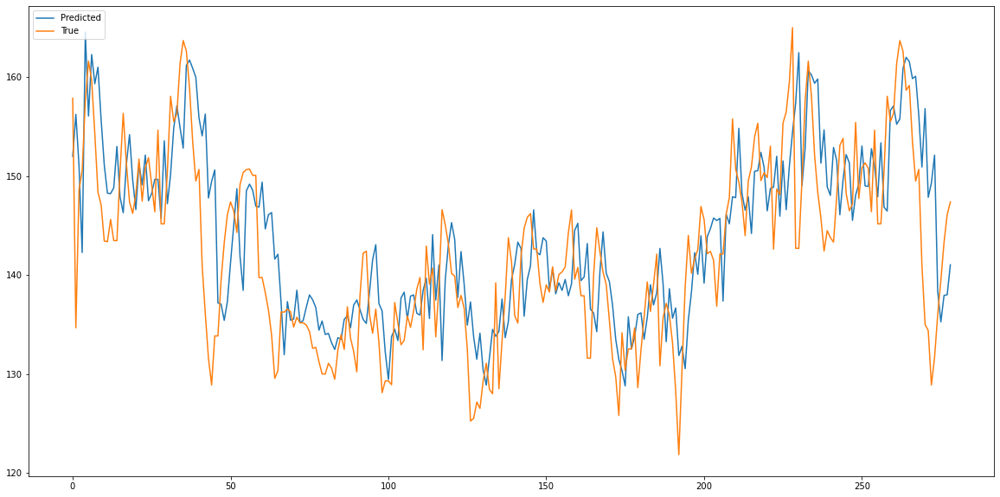

Finished Training


In [21]:
# Read dataset
print("==> Load dataset ...")
# X, y = read_data(dataroot, debug=False)

X = trial.iloc[:, 0:-3].values
y = np.array(trial.SBP)
print(y)
# Initialize model
print("==> Initialize DA-RNN model ...")
model = DA_rnn(
    X,
    y,
    ntimestep,
    nhidden_encoder,
    nhidden_decoder,
    batchsize,
    lr,
    epochs
)

# Train
print("==> Start training ...")
model.train()

# Prediction
y_pred = model.test()

fig1 = plt.figure()
plt.semilogy(range(len(model.iter_losses)), model.iter_losses)
plt.savefig("1.png")
plt.show()
plt.close(fig1)

fig2 = plt.figure()
plt.semilogy(range(len(model.epoch_losses)), model.epoch_losses)

plt.savefig("2.png")
plt.show()
plt.close(fig2)

fig3 = plt.figure()
plt.plot(y_pred, label='Predicted')
plt.plot(model.y[model.train_timesteps:], label="True")
plt.legend(loc='upper left')
plt.savefig("3.png")
plt.show()
plt.close(fig3)
print('Finished Training')

/tmp/ipykernel_1627139/1375171002.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  alpha = F.softmax(x.view(-1, self.input_size))
/tmp/ipykernel_1627139/1375171002.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  beta = F.softmax(self.attn_layer(


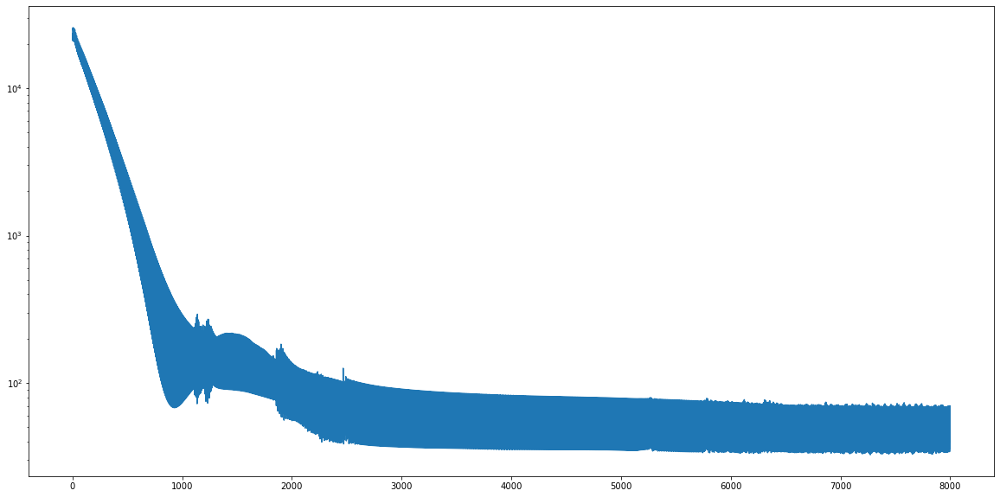

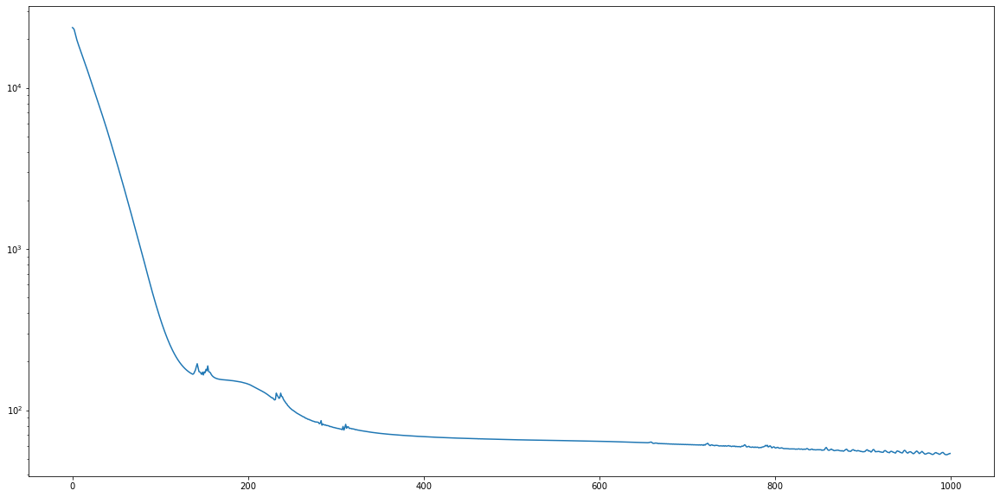

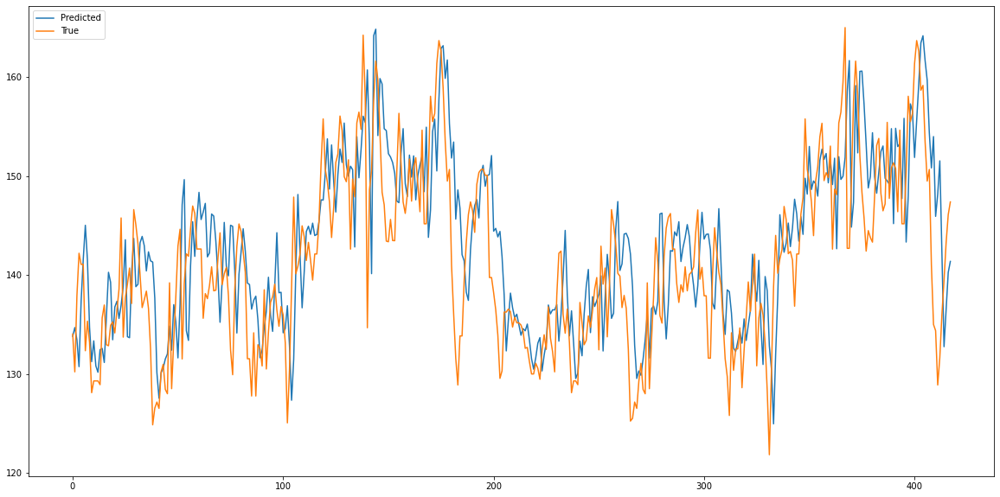

Finished Training


In [11]:
# Prediction
y_pred = model.test()

fig1 = plt.figure()
plt.semilogy(range(len(model.iter_losses)), model.iter_losses)
plt.savefig("1.png")
plt.show()
plt.close(fig1)

fig2 = plt.figure()
plt.semilogy(range(len(model.epoch_losses)), model.epoch_losses)

plt.savefig("2.png")
plt.show()
plt.close(fig2)

fig3 = plt.figure()
plt.plot(y_pred, label='Predicted')
plt.plot(model.y[model.train_timesteps:], label="True")
plt.legend(loc='upper left')
plt.savefig("3.png")
plt.show()
plt.close(fig3)
print('Finished Training')

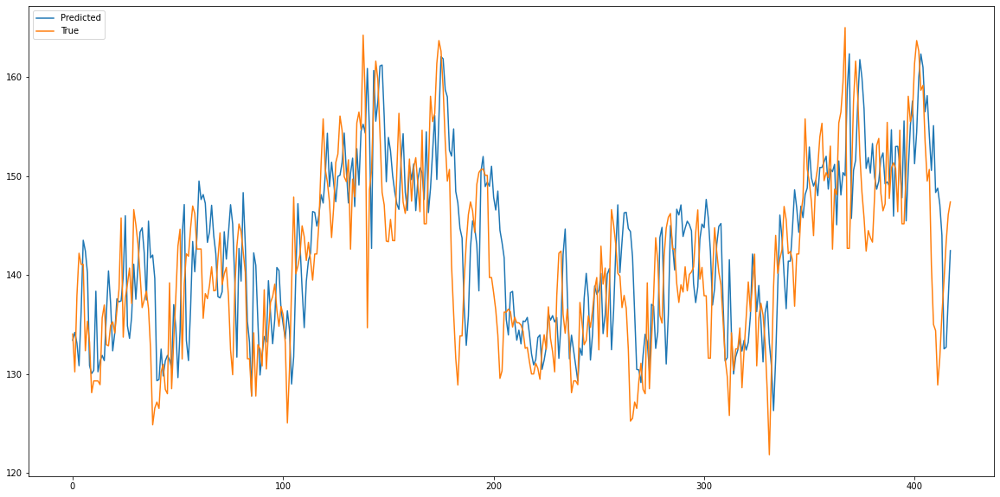

Finished Training


In [ ]:
fig3 = plt.figure()
plt.plot(y_pred, label='Predicted')
plt.plot(model.y[model.train_timesteps:], label="True")
plt.legend(loc='upper left')
plt.show()
plt.close(fig3)
print('Finished Training')

RMSE... 6.639702104232508
-1.7234806748288292
6.4121180897142835


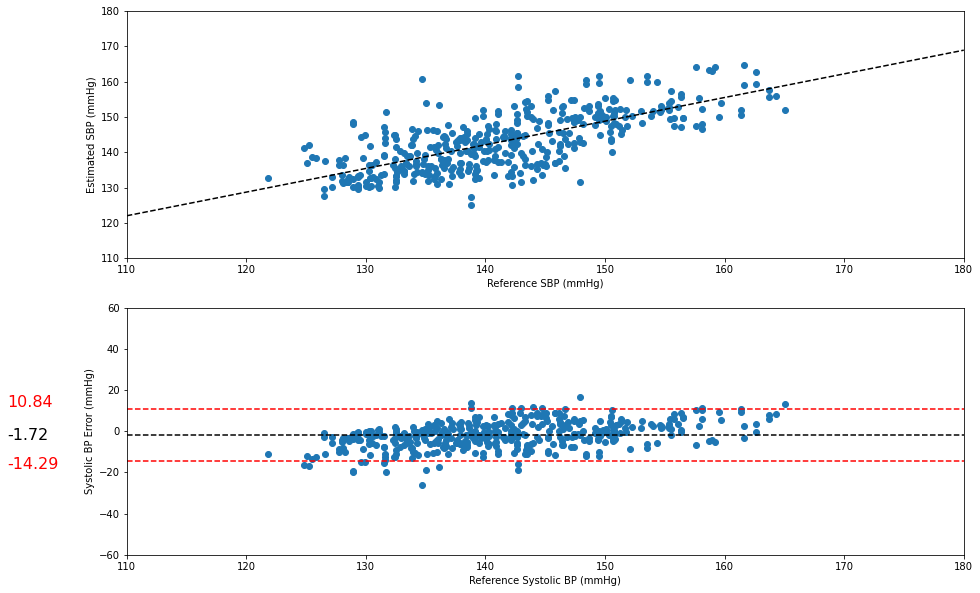

In [16]:
import math
import sklearn
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error

y_test = model.y[model.train_timesteps:]
preds = y_pred

rmse = math.sqrt(sklearn.metrics.mean_squared_error(y_test, preds.flatten()))

print('RMSE... ' + str(rmse))




fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 10))

######################################################
######################## Plot 1 ######################
######################################################
f = ax[0]

f.set_ylabel('Estimated SBP (mmHg)')
f.set_xlabel('Reference SBP (mmHg)')

x = y_test.flatten()
y = preds.flatten()
f.scatter(x, y)

z = np.polyfit(x, y, 1)
p = np.poly1d(z)
# w = [-30, 20]
w = [110, 180]
f.plot(w,p(w),"k--")

f.set_ylim(w)
f.set_xlim(w)

######################################################
######################## Plot 2 ######################
######################################################
f = ax[1]

f.set_ylabel('Systolic BP Error (mmHg)')
f.set_xlabel('Reference Systolic BP (mmHg)')

x = y_test.flatten()
y = y_test.flatten() - preds.flatten()
f.scatter(x, y)

bias = y.mean()
print(bias)
st = y.std()
print(st)
l_loa = bias-1.96*st
h_loa = bias+1.96*st

f.axhline(y=bias,  ls='--', color='k')
f.axhline(y=l_loa, ls='--', color='r')
f.axhline(y=h_loa, ls='--', color='r')

f.text(100, h_loa+1, f'{h_loa:.2f}'.rjust(5), color='r', fontsize=16)
f.text(100,  bias-2.5,   f'{bias:.2f}'.rjust(5), color='k', fontsize=16)
f.text(100, l_loa-4, f'{l_loa:.2f}'.rjust(5), color='r', fontsize=16)

f.set_ylim((-60,60))
f.set_xlim(w)



plt.show()

In [14]:
np.corrcoef(model.y[model.train_timesteps:], y_pred)

array([[1.        , 0.71336264],
       [0.71336264, 1.        ]])

In [ ]:
from sklearn.metrics import mean_squared_error
import math

mse = mean_squared_error(model.y[model.train_timesteps:], y_pred)

rmse = math.sqrt(mse)


In [ ]:
print(rmse)

6.929637588849949
